In [1]:
from IPython.display import HTML
from IPython.display import Image

Magic the Gathering Card Recognition Project (Part 1): 
=============================
The Subgame
===============================================

<img src='Shahrazad.jpg' width="540" height="370" align="left"/>

**By: Pieter Leffers**,

*Starting Date: September 1, 2018*

*Completion Date: - -, 2018*

*Last Updated: Nov 28, 2018*

Part 1: Project Description
-----------------

For this first part of the project I a want to lay the ground-work for future pieces of the project. To start with I want to be able to take in a video, retrieve an image of a card from the video, store the image and marry it with a label, and finally identify portions of the card that would be useful for identification at a later time. To put it simply I want to be able to generate a dataset of images for training from video sources. Although this portion of the project isn't absolutely necessary since I have an abundance of images, information, and databases to pull information from; however, this part of the project basically contains the bulk of the elements I will need for future identification of the cards.

***So what exactly will this do?***
1. Setup a database/directory structure for all named cards in the json database
2. Create a file of generic background *scenes* to places images on top of. 
3. Extract cards from video and place images within proper (previously mentioned) folders
4. Identify the portions of the card to be used for training
5. Marry the images and labels of the cards
6. Create a 'scene' with 1,2, or 3 random cards

**Challenges**
1. Lighting has to be good
2. Video has to be almost *parfait* with a black background
3. Has to recognize the card images within glossly sleeves
4. The backgrounds have to vary in style 
5. The colors, text, backgrounds, and art can make identificaion of card boundaries particularly difficult to find


Data Source(s):
-----------
- Phone camera
- A Magic the Gathering tournament deck
- Describable textures dataset https://www.robots.ox.ac.uk/~vgg/data/dtd/download/dtd-r1.0.1.tar.gz

Below is an example of how I took the video from the camera:


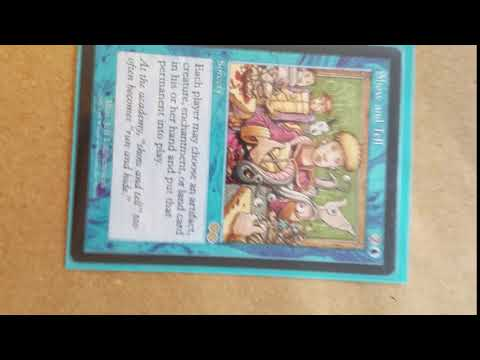

In [10]:
from IPython.display import YouTubeVideo
YouTubeVideo("uHIOnX9ktjs")

In [3]:
HTML('''<script>
  function code_toggle() {
    if (code_shown){
      $('div.input').hide('500');
      $('#toggleButton').val('Show Code')
    } else {
      $('div.input').show('500');
      $('#toggleButton').val('Hide Code')
    }
    code_shown = !code_shown
  }

  $( document ).ready(function(){
    code_shown=false;
    $('div.input').hide()
  });
</script>
<form action="javascript:code_toggle()"><input type="submit" id="toggleButton" value="Show Code"></form>''')

**Import packages**


In [2]:
import pandas as pd
import numpy as np
import cv2
import os
import operator
from tqdm import tqdm
import random
import os, re
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
import pickle
from glob import glob 
import imgaug as ia
from imgaug import augmenters as iaa
from shapely.geometry import Polygon

print('OpenCV Version:',cv2.__version__)

OpenCV Version: 3.4.3


In [3]:
#this is a piece of code I use over and over again for cleaning text
def scrubadub(variable):
    myList=(list(variable))
    clean=[]
    for i in range(0,len(myList)):
        #Regular expressions for removing web addresses
        url_reg  = r'[a-z]*[:.]+\S+'
        #and replacing with nothing
        url_text=re.sub(url_reg, '', myList[i])
        sep = " "
        junk = re.findall(r"(?i)\b[a-z]+\b", url_text)
        #join the seperated words
        junk = sep.join(junk)
        #remove _s_ spaces from text after punctuation removal
        S_space = re.sub(r' s ',' ',junk)
        clean.append(S_space)
    return clean

In [4]:
CardNames=pd.read_json('data\\labels\\AllCards.json')
CardNames=CardNames.transpose() #Make the data columnar
CardNames=CardNames.reset_index() #Change names from index to a column in dataset
CardNames=CardNames.sort_values(by='index',ascending=True)
CardNames['index']=scrubadub(CardNames['index'])
CardNames['index']=CardNames['index'].str.replace(' ','_',regex=True)#Replace spaces with undercarriage
CardNames=list(CardNames['index'])#Make a list of the names

In [5]:
CardNames[:5]

['Ach_Hans_Run',
 'Rumors_of_My_Death',
 'World_Champion',
 'A_Display_of_My_Dark_Power',
 'A_Reckoning_Approaches']

*Create a folder for each card*

In [6]:
root_path=os.getcwd()+'\\data\\cards' #Assigned location for the cards folders

for name in CardNames:
#    print(name)
    try:
        os.mkdir(os.path.join(root_path,str(name)))
    except:
        continue

*Measurements on the cards*

Use a ruler to measure the dimensions as indicated in the image below. 
For the corner* measures, the idea is to delimit one rectangular zone that can hold identification material. 

*Measures*

Report the measures in mm in the cell below (and don't forget to run the cell).

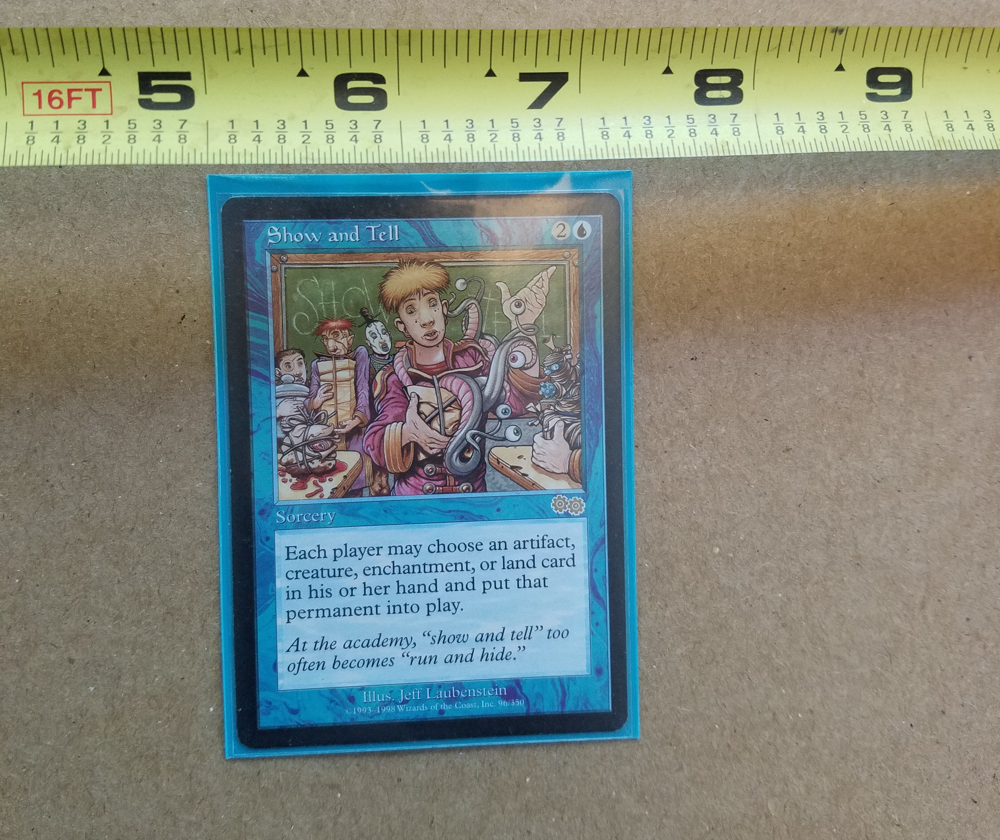

In [7]:
#Card Width
cardW=57 
Image("Width.jpg")

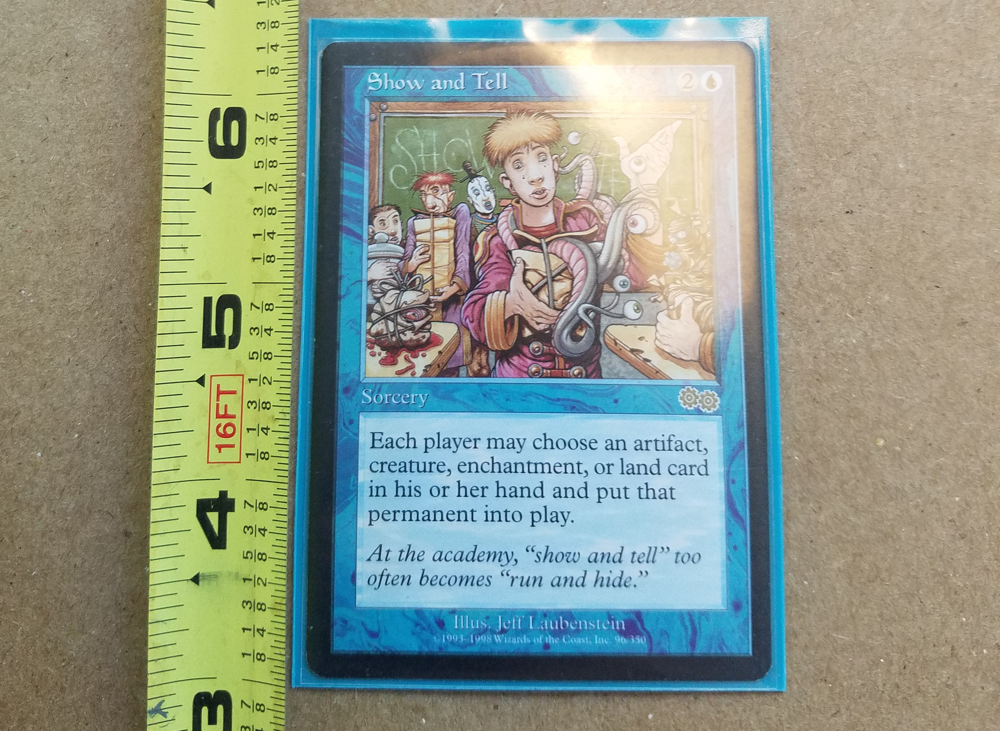

In [8]:
#Card Height
cardH=87 
Image("Height.jpg")

In [17]:
cornerXmin=5
cornerXmax=52
cornerYmin=4
cornerYmax=18
# We convert the measures from mm to pixels: multiply by an arbitrary factor 'zoom'
# You shouldn't need to change this
zoom=4
cardW*=zoom #228
cardH*=zoom #348
cornerXmin=int(cornerXmin*zoom)
cornerXmax=int(cornerXmax*zoom)
cornerYmin=int(cornerYmin*zoom)
cornerYmax=int(cornerYmax*zoom)

Global variables
---------------

In [18]:
data_dir="data" # Directory that will contain all kinds of data (the data we download and the data we generate)

if not os.path.isdir(data_dir):
    os.makedirs(data_dir)

names=CardNames

# Pickle file containing the background images from the DTD
backgrounds_pck_fn=data_dir+"\\backgrounds.pck"

# Pickle file containing the card images
cards_pck_fn=data_dir+"\\cards.pck"

# imgW,imgH: dimensions of the generated dataset images 
imgW=720
imgH=720

#https://math.stackexchange.com/questions/1764314/get-vertex-points-of-transformed-rectangle-knowing-bounding-box-and-transform-ma
#Card Dimensions
refCard=np.array([[0,0],[cardW,0],[cardW,cardH],[0,cardH]],dtype=np.float32)
refCardRot=np.array([[cardW,0],[cardW,cardH],[0,cardH],[0,0]],dtype=np.float32)
refCornerHL=np.array([[cornerXmin,cornerYmin],[cornerXmax,cornerYmin],[cornerXmax,cornerYmax],[cornerXmin,cornerYmax]],dtype=np.float32)
refCornerLR=np.array([[cardW-cornerXmax,cardH-cornerYmax],[cardW-cornerXmin,cardH-cornerYmax],[cardW-cornerXmin,cardH-cornerYmin],[cardW-cornerXmax,cardH-cornerYmin]],dtype=np.float32)
refCorners=np.array([refCornerHL,refCornerLR])


**Convenient Functions**

In [19]:
def display_img(img,polygons=[],channels="bgr",size=9):
    """
        Function to display an inline image, and draw optional polygons (bounding boxes, convex hulls) on it.
        Use the param 'channels' to specify the order of the channels ("bgr" for an image coming from OpenCV world)
    """
    if not isinstance(polygons,list):
        polygons=[polygons]    
    if channels=="bgr": # bgr (cv2 image)
        nb_channels=img.shape[2]
        if nb_channels==4:
            img=cv2.cvtColor(img,cv2.COLOR_BGRA2RGBA)
        else:
            img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)    
    fig,ax=plt.subplots(figsize=(size,size))
    ax.set_facecolor((0,0,0))
    ax.imshow(img)
    try:
        for polygon in polygons:
            # An polygon has either shape (n,2), 
            # either (n,1,2) if it is a cv2 contour (like convex hull).
            # In the latter case, reshape in (n,2)
            if len(polygon.shape)==3:
                polygon=polygon.reshape(-1,2)
            patch=patches.Polygon(polygon,linewidth=1,edgecolor='g',facecolor='none')
            ax.add_patch(patch)
    except:
        print(img)
        
def give_me_filename(dirname, suffixes, prefix=""):
    """
        Function that returns a filename or a list of filenames in directory 'dirname'
        that does not exist yet. If 'suffixes' is a list, one filename per suffix in 'suffixes':
        filename = dirname + "/" + prefix + random number + "." + suffix
        Same random number for all the file name
        Ex: 
            > give_me_filename("dir","jpg", prefix="prefix")
            'dir/prefix408290659.jpg'
            > give_me_filename("dir",["jpg","xml"])
            ['dir/877739594.jpg', 'dir/877739594.xml']        
    """
    if not isinstance(suffixes, list):
        suffixes=[suffixes]
    
    suffixes=[p if p[0]=='.' else '.'+p for p in suffixes]
          
    while True:
        bname="%09d"%random.randint(0,999999999)
        fnames=[]
        for suffix in suffixes:
            fname=os.path.join(dirname,prefix+bname+suffix)
            if not os.path.isfile(fname):
                fnames.append(fname)
                
        if len(fnames) == len(suffixes): break
    
    if len(fnames)==1:
        return fnames[0]
    else:
        return fnames


** Get Describable Textures Dataset (DTD)**

A convenient way to generate backgrounds for the images of the cards dataset

**Download DTD (1x)**

In [20]:
#!wget https://www.robots.ox.ac.uk/~vgg/data/dtd/download/dtd-r1.0.1.tar.gz

**Extract the DTD (1x)**

In [21]:
#!tar xf dtd-r1.0.1.tar.gz

**Load all *jpg from dtd subdirectories and save them in a pickle file (1x)**

The next times, we will directly load the pickle file 

In [22]:
print(backgrounds_pck_fn)

data\backgrounds.pck


In [23]:
dtd_dir="dtd\\images\\"
bg_images=[]
for subdir in glob(dtd_dir+"\\*"):
    for f in glob(subdir+"\\*.jpg"):
        bg_images.append(mpimg.imread(f))
print("Number of images loaded :",len(bg_images))
#pickle.dump(bg_images,open(backgrounds_pck_fn,'wb'),protocol=2)#python2 
pickle.dump(bg_images,open(backgrounds_pck_fn,'wb'))#python3
print("Saved in :",backgrounds_pck_fn)#backgrounds_pck_fn


Number of images loaded : 5640
Saved in : data\backgrounds.pck


In [26]:
# Clean-up
#!rm -r dtd
#!rm dtd-r1.0.1.tar.gz

### Load the backgounds pickle file in 'backgrounds'
'backgrounds' is an instance of the class Backgrounds
To get a random background image, call the method : backgrounds.get_random

In [27]:
class Backgrounds():
    def __init__(self,backgrounds_pck_fn=backgrounds_pck_fn):
        self._images=pickle.load(open(backgrounds_pck_fn,'rb'))
        self._nb_images=len(self._images)
        print("Number of images loaded :", self._nb_images)
    def get_random(self, display=False):
        bg=self._images[random.randint(0,self._nb_images-1)]
        if display: plt.imshow(bg)
        return bg
    
backgrounds = Backgrounds()

Nb of images loaded : 5640


In [55]:
#backgrounds = Backgrounds()

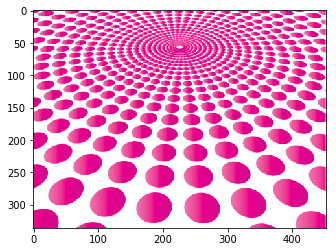

In [20]:
# Test: display a random background
_=backgrounds.get_random(display=True)


Extraction of the cards from pictures or video 
------------------------------------------

### Define the alphamask
The alphamask has 2 purposes:
- clean the border of the detected cards,
- make that border transparent. Cards are not perfect rectangles because corners are rounded. We need to make transparent the zone between the real card and its bounding rectangle, otherwise this zone will be visible in the final generated images of the dataset


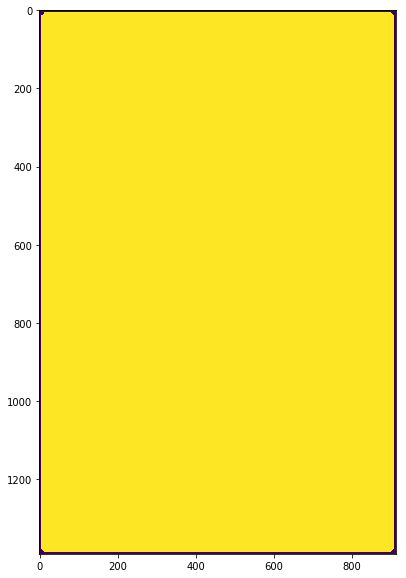

In [34]:
bord_size=5 # bord_size alpha=0
alphamask=np.ones((cardH,cardW),dtype=np.uint8)*255
cv2.rectangle(alphamask,(0,0),(cardW-1,cardH-1),0,bord_size)
cv2.line(alphamask,(bord_size*3,0),(0,bord_size*3),0,bord_size)
cv2.line(alphamask,(cardW-bord_size*3,0),(cardW,bord_size*3),0,bord_size)
cv2.line(alphamask,(0,cardH-bord_size*3),(bord_size*3,cardH),0,bord_size)
cv2.line(alphamask,(cardW-bord_size*3,cardH),(cardW,cardH-bord_size*3),0,bord_size)
plt.figure(figsize=(10,10))
plt.imshow(alphamask)

In [35]:
#alphamask=np.ones((cardH,cardW),dtype=np.uint8)*255

In [36]:
alphamask.shape

(1392, 912)

## Function extract_card 
Extract from scene image (cv2/bgr) the part corresponding to the card and transforms it 
to fit into the reference card shape.
We suppose here that the user facilitates as much as he can the extraction task by
making the scene image simple (one card on uniform backgroung, not too blurry, correct lighting,...)

In [37]:
def varianceOfLaplacian(img):
    """
    Compute the Laplacian of the image and then return the focus
    measure, which is simply the variance of the Laplacian
    Source: A.Rosebrock, https://www.pyimagesearch.com/2015/09/07/blur-detection-with-opencv/
    """
    return cv2.Laplacian(img, cv2.CV_64F).var()

Focus : 142.02487036297723 > 120


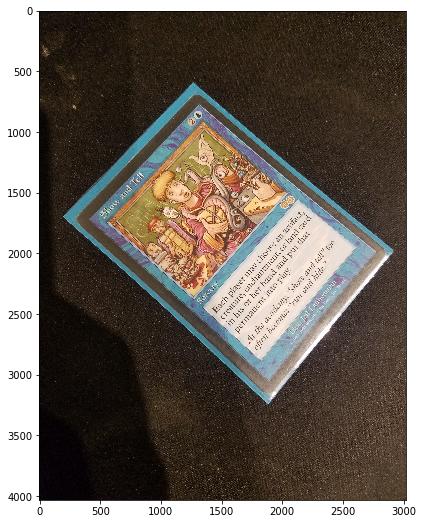

In [38]:
img=cv2.imread("data\\test\\2_142.jpg")
imgwarp=None
min_focus=120
# Check the image is not too blurry
focus=varianceOfLaplacian(img)
if focus < min_focus: 
    print("Focus too low :",focus,'<',min_focus)
else:
    print("Focus :",focus,'>',min_focus)
    display_img(img)

In [39]:
def extract_card (img, output_fn=None, min_focus=120, debug=False):
    """
    """
    
    imgwarp=None
    
    # Check the image is not too blurry
    focus=varianceOfLaplacian(img)
    if focus < min_focus: 
        if debug: print("Focus too low :", focus)
        return False,None
    
    #https://www.pyimagesearch.com/2014/04/21/building-pokedex-python-finding-game-boy-screen-step-4-6/
    #img = cv2.imread('data/test/3_131.jpg')

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    bilateral=cv2.bilateralFilter(gray,11,17,17)

    medBlur = cv2.medianBlur(bilateral,5)

    ret,thresh = cv2.threshold(medBlur,130,255,cv2.THRESH_BINARY)
    #th3 = cv2.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,cv.THRESH_BINARY,11,2)
    edge=cv2.Canny(thresh,30,200)

    # find contours in the edged image, keep only the largest
    # ones, and initialize our screen contour
    _,contours, hierarchy = cv2.findContours(edge.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = sorted(contours, key = cv2.contourArea, reverse = True)
    #first value
    #sorted_cnt=cnt[0]

    contidict={}   
    validict={}
    boxDict={}
    rectDict={}
    # loop over our contours save values into a dict to retrieve the maximum
    for c in range(0,len(cnts)):
        rect=cv2.minAreaRect(cnts[c])
        rectDict[c]=rect
        box=cv2.boxPoints(rect)
        box=np.int0(box)
        boxDict[c]=box
        areaCnt=cv2.contourArea(cnts[c])
        areaBox=cv2.contourArea(box)
        contidict[c]=areaBox
        try:
            valid=areaCnt/areaBox>0.95
            validict[c]=valid
        except:
            validict[c]=False


    #print(valid,':',areaCnt/areaBox)     
    maxarea=max(contidict.items(), key=operator.itemgetter(1))[0]

    if validict[maxarea]:
        # We want transform the zone inside the contour into the reference rectangle of dimensions (cardW,cardH)
        ((xr,yr),(wr,hr),thetar)=rectDict[maxarea]
        # Determine 'Mp' the transformation that transforms 'box' into the reference rectangle
        if wr>hr:
            Mp=cv2.getPerspectiveTransform(np.float32(boxDict[maxarea]),refCard)
        else:
            Mp=cv2.getPerspectiveTransform(np.float32(boxDict[maxarea]),refCardRot)
        # Determine the warped image by applying the transformation to the image
        imgwarp=cv2.warpPerspective(img,Mp,(cardW,cardH))
        # Add alpha layer
        imgwarp=cv2.cvtColor(imgwarp,cv2.COLOR_BGR2BGRA)

        # Shape of 'cnt' is (n,1,2), type=int with n = number of points
        # We reshape into (1,n,2), type=float32, before feeding to perspectiveTransform
        cnta=cnts[maxarea].reshape(1,-1,2).astype(np.float32)
        # Apply the transformation 'Mp' to the contour
        cntwarp=cv2.perspectiveTransform(cnta,Mp)
        cntwarp=cntwarp.astype(np.int)

        # We build the alpha channel so that we have transparency on the
        # external border of the card
        # First, initialize alpha channel fully transparent
        alphachannel=np.zeros(imgwarp.shape[:2],dtype=np.uint8)
        # Then fill in the contour to make opaque this zone of the card 
        cv2.drawContours(alphachannel,cntwarp,0,255,-1)

        # Apply the alphamask onto the alpha channel to clean it
        alphachannel=cv2.bitwise_and(alphachannel,alphamask)

        # Add the alphachannel to the warped image
        imgwarp[:,:,3]=alphachannel

        # Save the image to file
        if output_fn is not None:
            cv2.imwrite(output_fn,imgwarp)

    if debug:
        #cv2.imshow("Gray",gray)
        plt.imshow(gray)
        #cv2.imshow("Canny",edge)
        plt.imshow(edge)
        edge_bgr=cv2.cvtColor(edge,cv2.COLOR_GRAY2BGR)
        cv2.drawContours(edge_bgr,[boxDict[maxarea]],0,(0,0,255),3)
        cv2.drawContours(edge_bgr,[cnts[maxarea]],0,(0,255,0),-1)
        #cv2.imshow("Contour with biggest area",edge_bgr)
        plt.imshow(edge_bgr)
        
        if validict[maxarea]:
            #cv2.imshow("Alphachannel",alphachannel)
            plt.imshow(alphachannel, dtype = np.uint8)
            #cv2.imshow("Extracted card",imgwarp)
            plt.imshow(imgwarp)

    return valid,imgwarp

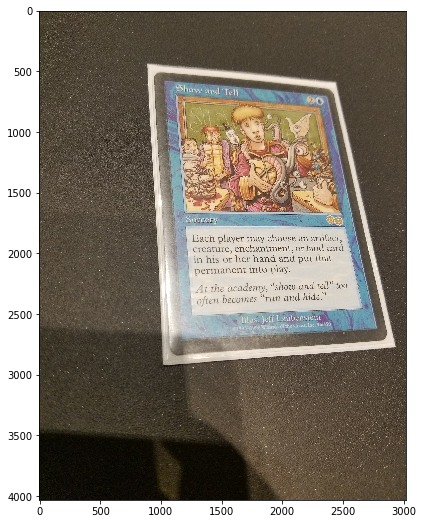

In [41]:
# Test on one image
debug=False
img=cv2.imread("data\\test\\3_131.jpg")
display_img(img)
valid,card=extract_card(img,"data\\test\\extracted_card.png", debug=debug, min_focus=60)
if valid:
    display_img(card)
if debug:
    cv2.waitKey(0)
    cv2.destroyAllWindows()

Function extract_cards_from_video
-----------------

In [43]:
def extract_cards_from_video(video_fn, output_dir=None, keep_ratio=5, min_focus=120, debug=False):
    """
        Extract cards from media file 'video_fn' 
        If 'output_dir' is specified, the cards are saved in 'output_dir'.
        One file per card with a random file name
        Because 2 consecutives frames are probably very similar, we don't use every frame of the video, 
        but only one every 'keep_ratio' frames
        
        Returns list of extracted images
    """
    #Check to see if the file specified is in the file path
    if not os.path.isfile(video_fn):
        print("Video file",video_fn,"does not exist !!!")
        return -1,[]
    #If the object output_dir has a value then change to match
    if output_dir is not None and not os.path.exists(output_dir):
        os.makedirs(output_dir)
        
    cap=cv2.VideoCapture(video_fn)
    
    frame_nb=0
    imgs_list=[]
    while True:
        ret,img=cap.read()
        if not ret: break
        # Work on every 'keep_ratio' frames
        if frame_nb%keep_ratio==0:
            if output_dir is not None:
                output_fn=give_me_filename(output_dir,"png")
            else:
                output_fn=None
            valid,card_img = extract_card(img,output_fn,min_focus=min_focus,debug=debug)
            if debug: 
                k=cv2.waitKey(1)
                if k==27: break
            if valid:
                imgs_list.append(card_img)
        frame_nb+=1
    
    if debug:
        cap.release()
        cv2.destroyAllWindows()
    
    return imgs_list

In [44]:
# Test card extraction from a video   
imgs=extract_cards_from_video("data\\video\\Brainstorm.mp4",output_dir="data\\cards\\Brainstorm",debug=False)
print("Number of images extracted:",len(imgs))

Number of images extracted: 22


Card extraction from all the videos
--------------
We suppose we have for each card_name (ex: Brainstorm, Show and Tell, Ancient Tomb) one video file named 'card_name.extension' (ex: Brainstorm.avi, Show_and_Tell.avi,  Ancient_Tomb.avi) in a common directory (ex: data/video). If you use images instead of movies, the script below should work by setting the variable 'extension' below to "jpg" or "png". 
The cards from a video, or the card from an image, will be extracted in a subdirectory named 'card_name' placed in the directory 'imgs_dir' (ex: data/cards)

In [30]:
#For 18,000 cards this can take awhile
video_dir="data\\video"
extension="mp4"
imgs_dir="data\\cards"

for name in CardNames:
        card_name=name
        video_fn=os.path.join(video_dir,card_name+"."+extension)
        output_dir=os.path.join(imgs_dir,card_name)
        if not os.path.isdir(output_dir):
            os.makedirs(output_dir)
        imgs=extract_cards_from_video(video_fn,output_dir, min_focus=120)
        #print("Extracted images for %s : %d"%(card_name,len(imgs)))

Video file data\video\Ach_Hans_Run.mp4 does not exist !!!
Video file data\video\Rumors_of_My_Death.mp4 does not exist !!!
Video file data\video\World_Champion.mp4 does not exist !!!
Video file data\video\A_Display_of_My_Dark_Power.mp4 does not exist !!!
Video file data\video\A_Reckoning_Approaches.mp4 does not exist !!!
Video file data\video\AWOL.mp4 does not exist !!!
Video file data\video\Abandon_Hope.mp4 does not exist !!!
Video file data\video\Abandon_Reason.mp4 does not exist !!!
Video file data\video\Abandoned_Outpost.mp4 does not exist !!!
Video file data\video\Abandoned_Sarcophagus.mp4 does not exist !!!
Video file data\video\Abattoir_Ghoul.mp4 does not exist !!!
Video file data\video\Abbey_Gargoyles.mp4 does not exist !!!
Video file data\video\Abbey_Griffin.mp4 does not exist !!!
Video file data\video\Abbey_Matron.mp4 does not exist !!!
Video file data\video\Abbot_of_Keral_Keep.mp4 does not exist !!!
Video file data\video\Abduction.mp4 does not exist !!!
Video file data\video\

Video file data\video\Ajani_Last_Stand.mp4 does not exist !!!
Video file data\video\Ajani_Mantra.mp4 does not exist !!!
Video file data\video\Ajani_Presence.mp4 does not exist !!!
Video file data\video\Ajani_Pridemate.mp4 does not exist !!!
Video file data\video\Ajani_Sunstriker.mp4 does not exist !!!
Video file data\video\Ajani_Welcome.mp4 does not exist !!!
Video file data\video\Ajani_Adversary_of_Tyrants.mp4 does not exist !!!
Video file data\video\Ajani_Caller_of_the_Pride.mp4 does not exist !!!
Video file data\video\Ajani_Mentor_of_Heroes.mp4 does not exist !!!
Video file data\video\Ajani_Valiant_Protector.mp4 does not exist !!!
Video file data\video\Ajani_Wise_Counselor.mp4 does not exist !!!
Video file data\video\Akiri_Line_Slinger.mp4 does not exist !!!
Video file data\video\Akki_Avalanchers.mp4 does not exist !!!
Video file data\video\Akki_Blizzard_Herder.mp4 does not exist !!!
Video file data\video\Akki_Coalflinger.mp4 does not exist !!!
Video file data\video\Akki_Drillmaster

Video file data\video\Angelic_Wall.mp4 does not exist !!!
Video file data\video\Angelsong.mp4 does not exist !!!
Video file data\video\Anger.mp4 does not exist !!!
Video file data\video\Anger_of_the_Gods.mp4 does not exist !!!
Video file data\video\Angler_Drake.mp4 does not exist !!!
Video file data\video\Angrath_Ambusher.mp4 does not exist !!!
Video file data\video\Angrath_Fury.mp4 does not exist !!!
Video file data\video\Angrath_Marauders.mp4 does not exist !!!
Video file data\video\Angrath_Minotaur_Pirate.mp4 does not exist !!!
Video file data\video\Angrath_the_Flame_Chained.mp4 does not exist !!!
Video file data\video\Angry_Mob.mp4 does not exist !!!
Video file data\video\Anguished_Unmaking.mp4 does not exist !!!
Video file data\video\Angus_Mackenzie.mp4 does not exist !!!
Video file data\video\Animal_Boneyard.mp4 does not exist !!!
Video file data\video\Animal_Magnetism.mp4 does not exist !!!
Video file data\video\Animar_Soul_of_Elements.mp4 does not exist !!!
Video file data\vide

Video file data\video\Artful_Looter.mp4 does not exist !!!
Video file data\video\Artful_Maneuver.mp4 does not exist !!!
Video file data\video\Artifact_Blast.mp4 does not exist !!!
Video file data\video\Artifact_Mutation.mp4 does not exist !!!
Video file data\video\Artifact_Possession.mp4 does not exist !!!
Video file data\video\Artifact_Ward.mp4 does not exist !!!
Video file data\video\Artificer_Assistant.mp4 does not exist !!!
Video file data\video\Artificer_Epiphany.mp4 does not exist !!!
Video file data\video\Artificer_Hex.mp4 does not exist !!!
Video file data\video\Artificer_Intuition.mp4 does not exist !!!
Video file data\video\Artificial_Evolution.mp4 does not exist !!!
Video file data\video\Artillerize.mp4 does not exist !!!
Video file data\video\Artisan_of_Forms.mp4 does not exist !!!
Video file data\video\Artisan_of_Kozilek.mp4 does not exist !!!
Video file data\video\Artisan_Sorrow.mp4 does not exist !!!
Video file data\video\Arvad_the_Cursed.mp4 does not exist !!!
Video fil

Video file data\video\Azorius_Charm.mp4 does not exist !!!
Video file data\video\Azorius_Cluestone.mp4 does not exist !!!
Video file data\video\Azorius_First_Wing.mp4 does not exist !!!
Video file data\video\Azorius_Guildgate.mp4 does not exist !!!
Video file data\video\Azorius_Guildmage.mp4 does not exist !!!
Video file data\video\Azorius_Herald.mp4 does not exist !!!
Video file data\video\Azorius_Justiciar.mp4 does not exist !!!
Video file data\video\Azorius_Keyrune.mp4 does not exist !!!
Video file data\video\Azorius_Ploy.mp4 does not exist !!!
Video file data\video\Azorius_Signet.mp4 does not exist !!!
Video file data\video\Azra_Bladeseeker.mp4 does not exist !!!
Video file data\video\Azra_Oddsmaker.mp4 does not exist !!!
Video file data\video\Azure_Drake.mp4 does not exist !!!
Video file data\video\Azure_Mage.mp4 does not exist !!!
Video file data\video\Azusa_Lost_but_Seeking.mp4 does not exist !!!
Video file data\video\B_I_N_G_O.mp4 does not exist !!!
Video file data\video\B_Big_

Video file data\video\Befuddle.mp4 does not exist !!!
Video file data\video\Beguiler_of_Wills.mp4 does not exist !!!
Video file data\video\Behemoth_Sledge.mp4 does not exist !!!
Video file data\video\Behemoth_Herald.mp4 does not exist !!!
Video file data\video\Behind_the_Scenes.mp4 does not exist !!!
Video file data\video\Behold_My_Grandeur.mp4 does not exist !!!
Video file data\video\Behold_the_Beyond.mp4 does not exist !!!
Video file data\video\Behold_the_Power_of_Destruction.mp4 does not exist !!!
Video file data\video\Belbe_Armor.mp4 does not exist !!!
Video file data\video\Belbe_Percher.mp4 does not exist !!!
Video file data\video\Belbe_Portal.mp4 does not exist !!!
Video file data\video\Belfry_Spirit.mp4 does not exist !!!
Video file data\video\Believe.mp4 does not exist !!!
Video file data\video\Belligerent_Brontodon.mp4 does not exist !!!
Video file data\video\Belligerent_Hatchling.mp4 does not exist !!!
Video file data\video\Belligerent_Sliver.mp4 does not exist !!!
Video file

Video file data\video\Blood_Vassal.mp4 does not exist !!!
Video file data\video\Blood_of_the_Martyr.mp4 does not exist !!!
Video file data\video\Blood_Chin_Fanatic.mp4 does not exist !!!
Video file data\video\Blood_Chin_Rager.mp4 does not exist !!!
Video file data\video\Blood_Cursed_Knight.mp4 does not exist !!!
Video file data\video\Blood_Toll_Harpy.mp4 does not exist !!!
Video file data\video\Bloodbond_March.mp4 does not exist !!!
Video file data\video\Bloodbond_Vampire.mp4 does not exist !!!
Video file data\video\Bloodborn_Scoundrels.mp4 does not exist !!!
Video file data\video\Bloodbraid_Elf.mp4 does not exist !!!
Video file data\video\Bloodbriar.mp4 does not exist !!!
Video file data\video\Bloodchief_Ascension.mp4 does not exist !!!
Video file data\video\Bloodcrazed_Goblin.mp4 does not exist !!!
Video file data\video\Bloodcrazed_Hoplite.mp4 does not exist !!!
Video file data\video\Bloodcrazed_Neonate.mp4 does not exist !!!
Video file data\video\Bloodcrazed_Paladin.mp4 does not exi

Video file data\video\Braidwood_Cup.mp4 does not exist !!!
Video file data\video\Braidwood_Sextant.mp4 does not exist !!!
Video file data\video\Brain_Freeze.mp4 does not exist !!!
Video file data\video\Brain_Gorgers.mp4 does not exist !!!
Video file data\video\Brain_Maggot.mp4 does not exist !!!
Video file data\video\Brain_Pry.mp4 does not exist !!!
Video file data\video\Brain_Weevil.mp4 does not exist !!!
Video file data\video\Brain_in_a_Jar.mp4 does not exist !!!
Video file data\video\Brainbite.mp4 does not exist !!!
Video file data\video\Braingeyser.mp4 does not exist !!!
Video file data\video\Brainspoil.mp4 does not exist !!!
Video file data\video\Brainwash.mp4 does not exist !!!
Video file data\video\Bramble_Creeper.mp4 does not exist !!!
Video file data\video\Bramble_Elemental.mp4 does not exist !!!
Video file data\video\Bramble_Sovereign.mp4 does not exist !!!
Video file data\video\Bramblecrush.mp4 does not exist !!!
Video file data\video\Bramblesnap.mp4 does not exist !!!
Video

Video file data\video\Cadaver_Imp.mp4 does not exist !!!
Video file data\video\Cadaverous_Bloom.mp4 does not exist !!!
Video file data\video\Cadaverous_Knight.mp4 does not exist !!!
Video file data\video\Cage_of_Hands.mp4 does not exist !!!
Video file data\video\Caged_Sun.mp4 does not exist !!!
Video file data\video\Cagemail.mp4 does not exist !!!
Video file data\video\Cairn_Wanderer.mp4 does not exist !!!
Video file data\video\Calciderm.mp4 does not exist !!!
Video file data\video\Calciform_Pools.mp4 does not exist !!!
Video file data\video\Calcite_Snapper.mp4 does not exist !!!
Video file data\video\Calculated_Dismissal.mp4 does not exist !!!
Video file data\video\Caldera_Hellion.mp4 does not exist !!!
Video file data\video\Caldera_Kavu.mp4 does not exist !!!
Video file data\video\Caldera_Lake.mp4 does not exist !!!
Video file data\video\Caligo_Skin_Witch.mp4 does not exist !!!
Video file data\video\Call.mp4 does not exist !!!
Video file data\video\Call_for_Blood.mp4 does not exist !

Video file data\video\Cephalid_Pathmage.mp4 does not exist !!!
Video file data\video\Cephalid_Retainer.mp4 does not exist !!!
Video file data\video\Cephalid_Sage.mp4 does not exist !!!
Video file data\video\Cephalid_Scout.mp4 does not exist !!!
Video file data\video\Cephalid_Shrine.mp4 does not exist !!!
Video file data\video\Cephalid_Snitch.mp4 does not exist !!!
Video file data\video\Cephalid_Vandal.mp4 does not exist !!!
Video file data\video\Cerebral_Eruption.mp4 does not exist !!!
Video file data\video\Cerebral_Vortex.mp4 does not exist !!!
Video file data\video\Ceremonial_Guard.mp4 does not exist !!!
Video file data\video\Ceremonious_Rejection.mp4 does not exist !!!
Video file data\video\Cerodon_Yearling.mp4 does not exist !!!
Video file data\video\Certain_Death.mp4 does not exist !!!
Video file data\video\Cerulean_Sphinx.mp4 does not exist !!!
Video file data\video\Cerulean_Wisps.mp4 does not exist !!!
Video file data\video\Cerulean_Wyvern.mp4 does not exist !!!
Video file data\

Video file data\video\Citadel_Castellan.mp4 does not exist !!!
Video file data\video\Citadel_Siege.mp4 does not exist !!!
Video file data\video\Citadel_of_Pain.mp4 does not exist !!!
Video file data\video\Citanul_Centaurs.mp4 does not exist !!!
Video file data\video\Citanul_Druid.mp4 does not exist !!!
Video file data\video\Citanul_Flute.mp4 does not exist !!!
Video file data\video\Citanul_Hierophants.mp4 does not exist !!!
Video file data\video\Citanul_Woodreaders.mp4 does not exist !!!
Video file data\video\City_in_a_Bottle.mp4 does not exist !!!
Video file data\video\City_of_Ass.mp4 does not exist !!!
Video file data\video\City_of_Brass.mp4 does not exist !!!
Video file data\video\City_of_Shadows.mp4 does not exist !!!
Video file data\video\City_of_Solitude.mp4 does not exist !!!
Video file data\video\Civic_Guildmage.mp4 does not exist !!!
Video file data\video\Civic_Saber.mp4 does not exist !!!
Video file data\video\Civic_Wayfinder.mp4 does not exist !!!
Video file data\video\Civil

Video file data\video\Conjurer_Closet.mp4 does not exist !!!
Video file data\video\Conquer.mp4 does not exist !!!
Video file data\video\Conquering_Manticore.mp4 does not exist !!!
Video file data\video\Conqueror_Flail.mp4 does not exist !!!
Video file data\video\Conqueror_Foothold.mp4 does not exist !!!
Video file data\video\Conqueror_Galleon.mp4 does not exist !!!
Video file data\video\Conqueror_Pledge.mp4 does not exist !!!
Video file data\video\Consecrate_Land.mp4 does not exist !!!
Video file data\video\Consecrated_Sphinx.mp4 does not exist !!!
Video file data\video\Consecrated_by_Blood.mp4 does not exist !!!
Video file data\video\Conservator.mp4 does not exist !!!
Video file data\video\Consign.mp4 does not exist !!!
Video file data\video\Consign_to_Dream.mp4 does not exist !!!
Video file data\video\Consign_to_Dust.mp4 does not exist !!!
Video file data\video\Conspiracy.mp4 does not exist !!!
Video file data\video\Constant_Mists.mp4 does not exist !!!
Video file data\video\Constric

Video file data\video\Crosis_the_Purger.mp4 does not exist !!!
Video file data\video\Crossbow_Ambush.mp4 does not exist !!!
Video file data\video\Crossbow_Infantry.mp4 does not exist !!!
Video file data\video\Crossroads_Consecrator.mp4 does not exist !!!
Video file data\video\Crosstown_Courier.mp4 does not exist !!!
Video file data\video\Crossway_Vampire.mp4 does not exist !!!
Video file data\video\Crosswinds.mp4 does not exist !!!
Video file data\video\Crovax.mp4 does not exist !!!
Video file data\video\Crovax_the_Cursed.mp4 does not exist !!!
Video file data\video\Crovax_Ascendant_Hero.mp4 does not exist !!!
Video file data\video\Crow_Storm.mp4 does not exist !!!
Video file data\video\Crow_of_Dark_Tidings.mp4 does not exist !!!
Video file data\video\Crowd_Favorites.mp4 does not exist !!!
Video file data\video\Crowd_of_Cinders.mp4 does not exist !!!
Video file data\video\Crowd_Favor.mp4 does not exist !!!
Video file data\video\Crown_of_Ascension.mp4 does not exist !!!
Video file data\

Video file data\video\Daring_Saboteur.mp4 does not exist !!!
Video file data\video\Daring_Skyjek.mp4 does not exist !!!
Video file data\video\Daring_Sleuth.mp4 does not exist !!!
Video file data\video\Daring_Thief.mp4 does not exist !!!
Video file data\video\Dark_Banishing.mp4 does not exist !!!
Video file data\video\Dark_Bargain.mp4 does not exist !!!
Video file data\video\Dark_Betrayal.mp4 does not exist !!!
Video file data\video\Dark_Confidant.mp4 does not exist !!!
Video file data\video\Dark_Dabbling.mp4 does not exist !!!
Video file data\video\Dark_Deal.mp4 does not exist !!!
Video file data\video\Dark_Depths.mp4 does not exist !!!
Video file data\video\Dark_Favor.mp4 does not exist !!!
Video file data\video\Dark_Hatchling.mp4 does not exist !!!
Video file data\video\Dark_Heart_of_the_Wood.mp4 does not exist !!!
Video file data\video\Dark_Impostor.mp4 does not exist !!!
Video file data\video\Dark_Inquiry.mp4 does not exist !!!
Video file data\video\Dark_Intimations.mp4 does not ex

Video file data\video\Deepfire_Elemental.mp4 does not exist !!!
Video file data\video\Deepglow_Skate.mp4 does not exist !!!
Video file data\video\Deeproot_Champion.mp4 does not exist !!!
Video file data\video\Deeproot_Elite.mp4 does not exist !!!
Video file data\video\Deeproot_Warrior.mp4 does not exist !!!
Video file data\video\Deeproot_Waters.mp4 does not exist !!!
Video file data\video\Deeptread_Merrow.mp4 does not exist !!!
Video file data\video\Deepwater_Hypnotist.mp4 does not exist !!!
Video file data\video\Deepwood_Drummer.mp4 does not exist !!!
Video file data\video\Deepwood_Elder.mp4 does not exist !!!
Video file data\video\Deepwood_Ghoul.mp4 does not exist !!!
Video file data\video\Deepwood_Legate.mp4 does not exist !!!
Video file data\video\Deepwood_Tantiv.mp4 does not exist !!!
Video file data\video\Deepwood_Wolverine.mp4 does not exist !!!
Video file data\video\Defang.mp4 does not exist !!!
Video file data\video\Defeat.mp4 does not exist !!!
Video file data\video\Defective

Video file data\video\Dingus_Egg.mp4 does not exist !!!
Video file data\video\Dingus_Staff.mp4 does not exist !!!
Video file data\video\Dinosaur_Hunter.mp4 does not exist !!!
Video file data\video\Dinosaur_Stampede.mp4 does not exist !!!
Video file data\video\Dinrova_Horror.mp4 does not exist !!!
Video file data\video\Diplomacy_of_the_Wastes.mp4 does not exist !!!
Video file data\video\Diplomatic_Escort.mp4 does not exist !!!
Video file data\video\Diplomatic_Immunity.mp4 does not exist !!!
Video file data\video\Dire_Fleet_Captain.mp4 does not exist !!!
Video file data\video\Dire_Fleet_Daredevil.mp4 does not exist !!!
Video file data\video\Dire_Fleet_Hoarder.mp4 does not exist !!!
Video file data\video\Dire_Fleet_Interloper.mp4 does not exist !!!
Video file data\video\Dire_Fleet_Neckbreaker.mp4 does not exist !!!
Video file data\video\Dire_Fleet_Poisoner.mp4 does not exist !!!
Video file data\video\Dire_Fleet_Ravager.mp4 does not exist !!!
Video file data\video\Dire_Undercurrents.mp4 do

Video file data\video\Draining_Whelk.mp4 does not exist !!!
Video file data\video\Drainpipe_Vermin.mp4 does not exist !!!
Video file data\video\Drake_Familiar.mp4 does not exist !!!
Video file data\video\Drake_Hatchling.mp4 does not exist !!!
Video file data\video\Drake_Haven.mp4 does not exist !!!
Video file data\video\Drake_Umbra.mp4 does not exist !!!
Video file data\video\Drake_Skull_Cameo.mp4 does not exist !!!
Video file data\video\Drakestown_Forgotten.mp4 does not exist !!!
Video file data\video\Drakewing_Krasis.mp4 does not exist !!!
Video file data\video\Dralnu_Crusade.mp4 does not exist !!!
Video file data\video\Dralnu_Pet.mp4 does not exist !!!
Video file data\video\Dralnu_Lich_Lord.mp4 does not exist !!!
Video file data\video\Dramatic_Entrance.mp4 does not exist !!!
Video file data\video\Dramatic_Rescue.mp4 does not exist !!!
Video file data\video\Dramatic_Reversal.mp4 does not exist !!!
Video file data\video\Drana_Chosen.mp4 does not exist !!!
Video file data\video\Drana_E

Video file data\video\Earnest_Fellowship.mp4 does not exist !!!
Video file data\video\Earsplitting_Rats.mp4 does not exist !!!
Video file data\video\Earth.mp4 does not exist !!!
Video file data\video\Earth_Elemental.mp4 does not exist !!!
Video file data\video\Earth_Rift.mp4 does not exist !!!
Video file data\video\Earth_Servant.mp4 does not exist !!!
Video file data\video\Earth_Surge.mp4 does not exist !!!
Video file data\video\Earth_Origin_Yak.mp4 does not exist !!!
Video file data\video\Earthbind.mp4 does not exist !!!
Video file data\video\Earthblighter.mp4 does not exist !!!
Video file data\video\Earthbrawn.mp4 does not exist !!!
Video file data\video\Earthcraft.mp4 does not exist !!!
Video file data\video\Earthen_Arms.mp4 does not exist !!!
Video file data\video\Earthen_Goo.mp4 does not exist !!!
Video file data\video\Earthlink.mp4 does not exist !!!
Video file data\video\Earthlore.mp4 does not exist !!!
Video file data\video\Earthquake.mp4 does not exist !!!
Video file data\vide

Video file data\video\Enatu_Golem.mp4 does not exist !!!
Video file data\video\Encampment_Keeper.mp4 does not exist !!!
Video file data\video\Encase_in_Ice.mp4 does not exist !!!
Video file data\video\Enchanted_Being.mp4 does not exist !!!
Video file data\video\Enchanted_Evening.mp4 does not exist !!!
Video file data\video\Enchanter_Bane.mp4 does not exist !!!
Video file data\video\Enchantment_Alteration.mp4 does not exist !!!
Video file data\video\Enchantress_Presence.mp4 does not exist !!!
Video file data\video\Encircling_Fissure.mp4 does not exist !!!
Video file data\video\Enclave_Cryptologist.mp4 does not exist !!!
Video file data\video\Enclave_Elite.mp4 does not exist !!!
Video file data\video\Encroach.mp4 does not exist !!!
Video file data\video\Encroaching_Wastes.mp4 does not exist !!!
Video file data\video\Encrust.mp4 does not exist !!!
Video file data\video\End_Hostilities.mp4 does not exist !!!
Video file data\video\Endangered_Armodon.mp4 does not exist !!!
Video file data\vi

Video file data\video\Exava_Rakdos_Blood_Witch.mp4 does not exist !!!
Video file data\video\Excavation.mp4 does not exist !!!
Video file data\video\Excavation_Elephant.mp4 does not exist !!!
Video file data\video\Excavator.mp4 does not exist !!!
Video file data\video\Excise.mp4 does not exist !!!
Video file data\video\Exclude.mp4 does not exist !!!
Video file data\video\Exclusion_Mage.mp4 does not exist !!!
Video file data\video\Exclusion_Ritual.mp4 does not exist !!!
Video file data\video\Excommunicate.mp4 does not exist !!!
Video file data\video\Excoriate.mp4 does not exist !!!
Video file data\video\Excruciator.mp4 does not exist !!!
Video file data\video\Execute.mp4 does not exist !!!
Video file data\video\Executioner_Capsule.mp4 does not exist !!!
Video file data\video\Executioner_Hood.mp4 does not exist !!!
Video file data\video\Executioner_Swing.mp4 does not exist !!!
Video file data\video\Exemplar_of_Strength.mp4 does not exist !!!
Video file data\video\Exert_Influence.mp4 does 

Video file data\video\Feiyi_Snake.mp4 does not exist !!!
Video file data\video\Feldon_of_the_Third_Path.mp4 does not exist !!!
Video file data\video\Feldon_Cane.mp4 does not exist !!!
Video file data\video\Felhide_Brawler.mp4 does not exist !!!
Video file data\video\Felhide_Minotaur.mp4 does not exist !!!
Video file data\video\Felhide_Petrifier.mp4 does not exist !!!
Video file data\video\Felhide_Spiritbinder.mp4 does not exist !!!
Video file data\video\Felidar_Cub.mp4 does not exist !!!
Video file data\video\Felidar_Guardian.mp4 does not exist !!!
Video file data\video\Felidar_Sovereign.mp4 does not exist !!!
Video file data\video\Felidar_Umbra.mp4 does not exist !!!
Video file data\video\Fell_Flagship.mp4 does not exist !!!
Video file data\video\Fell_Shepherd.mp4 does not exist !!!
Video file data\video\Fell_Specter.mp4 does not exist !!!
Video file data\video\Fell_the_Mighty.mp4 does not exist !!!
Video file data\video\Fellwar_Stone.mp4 does not exist !!!
Video file data\video\Femer

Video file data\video\Flash_of_Insight.mp4 does not exist !!!
Video file data\video\Flashfires.mp4 does not exist !!!
Video file data\video\Flashfreeze.mp4 does not exist !!!
Video file data\video\Flatten.mp4 does not exist !!!
Video file data\video\Flay.mp4 does not exist !!!
Video file data\video\Flayed_Nim.mp4 does not exist !!!
Video file data\video\Flayer_Drone.mp4 does not exist !!!
Video file data\video\Flayer_Husk.mp4 does not exist !!!
Video file data\video\Flayer_of_the_Hatebound.mp4 does not exist !!!
Video file data\video\Flaying_Tendrils.mp4 does not exist !!!
Video file data\video\Fledgling_Djinn.mp4 does not exist !!!
Video file data\video\Fledgling_Dragon.mp4 does not exist !!!
Video file data\video\Fledgling_Griffin.mp4 does not exist !!!
Video file data\video\Fledgling_Imp.mp4 does not exist !!!
Video file data\video\Fledgling_Mawcor.mp4 does not exist !!!
Video file data\video\Fledgling_Osprey.mp4 does not exist !!!
Video file data\video\Fleecemane_Lion.mp4 does not 

Video file data\video\Fretwork_Colony.mp4 does not exist !!!
Video file data\video\Freyalise_Supplicant.mp4 does not exist !!!
Video file data\video\Freyalise_Charm.mp4 does not exist !!!
Video file data\video\Freyalise_Radiance.mp4 does not exist !!!
Video file data\video\Freyalise_Winds.mp4 does not exist !!!
Video file data\video\Freyalise_Llanowar_Fury.mp4 does not exist !!!
Video file data\video\Friendly_Fire.mp4 does not exist !!!
Video file data\video\Frightcrawler.mp4 does not exist !!!
Video file data\video\Frightful_Delusion.mp4 does not exist !!!
Video file data\video\Frightshroud_Courier.mp4 does not exist !!!
Video file data\video\Frilled_Deathspitter.mp4 does not exist !!!
Video file data\video\Frilled_Oculus.mp4 does not exist !!!
Video file data\video\Frilled_Sandwalla.mp4 does not exist !!!
Video file data\video\Frilled_Sea_Serpent.mp4 does not exist !!!
Video file data\video\Frog_Tongue.mp4 does not exist !!!
Video file data\video\Frogmite.mp4 does not exist !!!
Video

Video file data\video\Gerrymandering.mp4 does not exist !!!
Video file data\video\Get_a_Life.mp4 does not exist !!!
Video file data\video\Geth_Grimoire.mp4 does not exist !!!
Video file data\video\Geth_Verdict.mp4 does not exist !!!
Video file data\video\Geth_Lord_of_the_Vault.mp4 does not exist !!!
Video file data\video\Geyser_Glider.mp4 does not exist !!!
Video file data\video\Geyserfield_Stalker.mp4 does not exist !!!
Video file data\video\Ghalma_Warden.mp4 does not exist !!!
Video file data\video\Ghalta_Primal_Hunger.mp4 does not exist !!!
Video file data\video\Ghastbark_Twins.mp4 does not exist !!!
Video file data\video\Ghastlord_of_Fugue.mp4 does not exist !!!
Video file data\video\Ghastly_Conscription.mp4 does not exist !!!
Video file data\video\Ghastly_Demise.mp4 does not exist !!!
Video file data\video\Ghastly_Discovery.mp4 does not exist !!!
Video file data\video\Ghastly_Haunting.mp4 does not exist !!!
Video file data\video\Ghastly_Remains.mp4 does not exist !!!
Video file da

Video file data\video\Gnat_Alley_Creeper.mp4 does not exist !!!
Video file data\video\Gnat_Miser.mp4 does not exist !!!
Video file data\video\Gnathosaur.mp4 does not exist !!!
Video file data\video\Gnaw_to_the_Bone.mp4 does not exist !!!
Video file data\video\Gnawing_Zombie.mp4 does not exist !!!
Video file data\video\Gnome_Made_Engine.mp4 does not exist !!!
Video file data\video\Gnomeball_Machine.mp4 does not exist !!!
Video file data\video\Go_for_the_Throat.mp4 does not exist !!!
Video file data\video\Goatnapper.mp4 does not exist !!!
Video file data\video\Gobbling_Ooze.mp4 does not exist !!!
Video file data\video\Gobhobbler_Rats.mp4 does not exist !!!
Video file data\video\Goblin.mp4 does not exist !!!
Video file data\video\Goblin_Archaeologist.mp4 does not exist !!!
Video file data\video\Goblin_Arsonist.mp4 does not exist !!!
Video file data\video\Goblin_Artillery.mp4 does not exist !!!
Video file data\video\Goblin_Artisans.mp4 does not exist !!!
Video file data\video\Goblin_Assass

Video file data\video\Grandmother_Sengir.mp4 does not exist !!!
Video file data\video\Granger_Guildmage.mp4 does not exist !!!
Video file data\video\Granite_Gargoyle.mp4 does not exist !!!
Video file data\video\Granite_Grip.mp4 does not exist !!!
Video file data\video\Granite_Shard.mp4 does not exist !!!
Video file data\video\Granitic_Titan.mp4 does not exist !!!
Video file data\video\Granny_Payback.mp4 does not exist !!!
Video file data\video\Granulate.mp4 does not exist !!!
Video file data\video\Grapeshot.mp4 does not exist !!!
Video file data\video\Grapeshot_Catapult.mp4 does not exist !!!
Video file data\video\Graphic_Violence.mp4 does not exist !!!
Video file data\video\Grapple_with_the_Past.mp4 does not exist !!!
Video file data\video\Grappler_Spider.mp4 does not exist !!!
Video file data\video\Grappling_Hook.mp4 does not exist !!!
Video file data\video\Grasp_of_Darkness.mp4 does not exist !!!
Video file data\video\Grasp_of_Fate.mp4 does not exist !!!
Video file data\video\Grasp_

Video file data\video\Gudul_Lurker.mp4 does not exist !!!
Video file data\video\Guerrilla_Tactics.mp4 does not exist !!!
Video file data\video\Guest_List.mp4 does not exist !!!
Video file data\video\Guided_Passage.mp4 does not exist !!!
Video file data\video\Guided_Strike.mp4 does not exist !!!
Video file data\video\Guiding_Spirit.mp4 does not exist !!!
Video file data\video\Guild_Feud.mp4 does not exist !!!
Video file data\video\Guildscorn_Ward.mp4 does not exist !!!
Video file data\video\Guile.mp4 does not exist !!!
Video file data\video\Guiltfeeder.mp4 does not exist !!!
Video file data\video\Guilty_Conscience.mp4 does not exist !!!
Video file data\video\Guise_of_Fire.mp4 does not exist !!!
Video file data\video\Gulf_Squid.mp4 does not exist !!!
Video file data\video\Guma.mp4 does not exist !!!
Video file data\video\Gurmag_Angler.mp4 does not exist !!!
Video file data\video\Gurmag_Drowner.mp4 does not exist !!!
Video file data\video\Gurmag_Swiftwing.mp4 does not exist !!!
Video file

Video file data\video\Heartwood_Dryad.mp4 does not exist !!!
Video file data\video\Heartwood_Giant.mp4 does not exist !!!
Video file data\video\Heartwood_Shard.mp4 does not exist !!!
Video file data\video\Heartwood_Storyteller.mp4 does not exist !!!
Video file data\video\Heartwood_Storyteller_Avatar.mp4 does not exist !!!
Video file data\video\Heartwood_Treefolk.mp4 does not exist !!!
Video file data\video\Heat_Ray.mp4 does not exist !!!
Video file data\video\Heat_Shimmer.mp4 does not exist !!!
Video file data\video\Heat_Stroke.mp4 does not exist !!!
Video file data\video\Heat_Wave.mp4 does not exist !!!
Video file data\video\Heat_of_Battle.mp4 does not exist !!!
Video file data\video\Heaven.mp4 does not exist !!!
Video file data\video\Heaven_Gate.mp4 does not exist !!!
Video file data\video\Heavenly_Blademaster.mp4 does not exist !!!
Video file data\video\Heavenly_Qilin.mp4 does not exist !!!
Video file data\video\Heavy_Arbalest.mp4 does not exist !!!
Video file data\video\Heavy_Balli

Video file data\video\Honored_Hierarch.mp4 does not exist !!!
Video file data\video\Honored_Hydra.mp4 does not exist !!!
Video file data\video\Hooded_Assassin.mp4 does not exist !!!
Video file data\video\Hooded_Brawler.mp4 does not exist !!!
Video file data\video\Hooded_Horror.mp4 does not exist !!!
Video file data\video\Hooded_Hydra.mp4 does not exist !!!
Video file data\video\Hooded_Kavu.mp4 does not exist !!!
Video file data\video\Hoodwink.mp4 does not exist !!!
Video file data\video\Hoof_Skulkin.mp4 does not exist !!!
Video file data\video\Hoofprints_of_the_Stag.mp4 does not exist !!!
Video file data\video\Hooting_Mandrills.mp4 does not exist !!!
Video file data\video\Hope_Against_Hope.mp4 does not exist !!!
Video file data\video\Hope_Charm.mp4 does not exist !!!
Video file data\video\Hope_Tender.mp4 does not exist !!!
Video file data\video\Hope_and_Glory.mp4 does not exist !!!
Video file data\video\Hope_of_Ghirapur.mp4 does not exist !!!
Video file data\video\Hopeful_Eidolon.mp4 d

Video file data\video\Illusionary_Servant.mp4 does not exist !!!
Video file data\video\Illusionary_Terrain.mp4 does not exist !!!
Video file data\video\Illusionary_Wall.mp4 does not exist !!!
Video file data\video\Illusionist_Bracers.mp4 does not exist !!!
Video file data\video\Illusionist_Gambit.mp4 does not exist !!!
Video file data\video\Illusionist_Stratagem.mp4 does not exist !!!
Video file data\video\Illusions_of_Grandeur.mp4 does not exist !!!
Video file data\video\Illusory_Ambusher.mp4 does not exist !!!
Video file data\video\Illusory_Angel.mp4 does not exist !!!
Video file data\video\Illusory_Demon.mp4 does not exist !!!
Video file data\video\Illusory_Gains.mp4 does not exist !!!
Video file data\video\Illusory_Wrappings.mp4 does not exist !!!
Video file data\video\Imagecrafter.mp4 does not exist !!!
Video file data\video\Imaginary_Pet.mp4 does not exist !!!
Video file data\video\Imaginary_Threats.mp4 does not exist !!!
Video file data\video\Imi_Statue.mp4 does not exist !!!
Vi

Video file data\video\Iron_Myr.mp4 does not exist !!!
Video file data\video\Iron_Star.mp4 does not exist !!!
Video file data\video\Iron_Tusk_Elephant.mp4 does not exist !!!
Video file data\video\Iron_Will.mp4 does not exist !!!
Video file data\video\Iron_Barb_Hellion.mp4 does not exist !!!
Video file data\video\Iron_Heart_Chimera.mp4 does not exist !!!
Video file data\video\Ironclad_Revolutionary.mp4 does not exist !!!
Video file data\video\Ironclad_Slayer.mp4 does not exist !!!
Video file data\video\Ironclaw_Buzzardiers.mp4 does not exist !!!
Video file data\video\Ironclaw_Curse.mp4 does not exist !!!
Video file data\video\Ironclaw_Orcs.mp4 does not exist !!!
Video file data\video\Ironfang.mp4 does not exist !!!
Video file data\video\Ironfist_Crusher.mp4 does not exist !!!
Video file data\video\Ironhoof_Ox.mp4 does not exist !!!
Video file data\video\Ironroot_Treefolk.mp4 does not exist !!!
Video file data\video\Ironshell_Beetle.mp4 does not exist !!!
Video file data\video\Irontread_C

Video file data\video\Junk_Diver.mp4 does not exist !!!
Video file data\video\Junk_Golem.mp4 does not exist !!!
Video file data\video\Junktroller.mp4 does not exist !!!
Video file data\video\Junkyo_Bell.mp4 does not exist !!!
Video file data\video\Juntu_Stakes.mp4 does not exist !!!
Video file data\video\Efreet.mp4 does not exist !!!
Video file data\video\Jushi_Apprentice.mp4 does not exist !!!
Video file data\video\Just_Desserts.mp4 does not exist !!!
Video file data\video\Just_Fate.mp4 does not exist !!!
Video file data\video\Just_the_Wind.mp4 does not exist !!!
Video file data\video\Justice.mp4 does not exist !!!
Video file data\video\Juvenile_Gloomwidow.mp4 does not exist !!!
Video file data\video\Juxtapose.mp4 does not exist !!!
Video file data\video\m_Djinn.mp4 does not exist !!!
Video file data\video\Jwar_Isle_Avenger.mp4 does not exist !!!
Video file data\video\Jwar_Isle_Refuge.mp4 does not exist !!!
Video file data\video\Jwari_Scuttler.mp4 does not exist !!!
Video file data\vi

Video file data\video\Kinsbaile_Skirmisher.mp4 does not exist !!!
Video file data\video\Kinscaer_Harpoonist.mp4 does not exist !!!
Video file data\video\Kiora_Dismissal.mp4 does not exist !!!
Video file data\video\Kiora_Follower.mp4 does not exist !!!
Video file data\video\Kiora_Master_of_the_Depths.mp4 does not exist !!!
Video file data\video\Kiora_the_Crashing_Wave.mp4 does not exist !!!
Video file data\video\Kira_Great_Glass_Spinner.mp4 does not exist !!!
Video file data\video\Kird_Ape.mp4 does not exist !!!
Video file data\video\Kird_Chieftain.mp4 does not exist !!!
Video file data\video\Kiri_Onna.mp4 does not exist !!!
Video file data\video\Kirtar_Desire.mp4 does not exist !!!
Video file data\video\Kirtar_Wrath.mp4 does not exist !!!
Video file data\video\Kismet.mp4 does not exist !!!
Video file data\video\Kiss_of_Death.mp4 does not exist !!!
Video file data\video\Kiss_of_the_Amesha.mp4 does not exist !!!
Video file data\video\Kitchen_Finks.mp4 does not exist !!!
Video file data\v

Video file data\video\Kwende_Pride_of_Femeref.mp4 does not exist !!!
Video file data\video\Kydele_Chosen_of_Kruphix.mp4 does not exist !!!
Video file data\video\Kynaios_and_Tiro_of_Meletis.mp4 does not exist !!!
Video file data\video\Kyoki_Sanity_Eclipse.mp4 does not exist !!!
Video file data\video\Kyren_Archive.mp4 does not exist !!!
Video file data\video\Kyren_Glider.mp4 does not exist !!!
Video file data\video\Kyren_Legate.mp4 does not exist !!!
Video file data\video\Kyren_Negotiations.mp4 does not exist !!!
Video file data\video\Kyren_Sniper.mp4 does not exist !!!
Video file data\video\Kyren_Toy.mp4 does not exist !!!
Video file data\video\Kyscu_Drake.mp4 does not exist !!!
Video file data\video\Kytheon_Irregulars.mp4 does not exist !!!
Video file data\video\Kytheon_Tactics.mp4 does not exist !!!
Video file data\video\Kytheon_Hero_of_Akros.mp4 does not exist !!!
Video file data\video\Lab_Rats.mp4 does not exist !!!
Video file data\video\Laboratory_Brute.mp4 does not exist !!!
Video

Video file data\video\Lifted_by_Clouds.mp4 does not exist !!!
Video file data\video\Light_from_Within.mp4 does not exist !!!
Video file data\video\Light_of_Day.mp4 does not exist !!!
Video file data\video\Light_of_Sanction.mp4 does not exist !!!
Video file data\video\Lightbringer.mp4 does not exist !!!
Video file data\video\Lightform.mp4 does not exist !!!
Video file data\video\Lighthouse_Chronologist.mp4 does not exist !!!
Video file data\video\Lightkeeper_of_Emeria.mp4 does not exist !!!
Video file data\video\Lightmine_Field.mp4 does not exist !!!
Video file data\video\Lightning_Angel.mp4 does not exist !!!
Video file data\video\Lightning_Axe.mp4 does not exist !!!
Video file data\video\Lightning_Berserker.mp4 does not exist !!!
Video file data\video\Lightning_Blast.mp4 does not exist !!!
Video file data\video\Lightning_Blow.mp4 does not exist !!!
Video file data\video\Lightning_Bolt.mp4 does not exist !!!
Video file data\video\Lightning_Cloud.mp4 does not exist !!!
Video file data\v

Video file data\video\Luminesce.mp4 does not exist !!!
Video file data\video\Luminescent_Rain.mp4 does not exist !!!
Video file data\video\Luminous_Angel.mp4 does not exist !!!
Video file data\video\Luminous_Bonds.mp4 does not exist !!!
Video file data\video\Luminous_Guardian.mp4 does not exist !!!
Video file data\video\Luminous_Wake.mp4 does not exist !!!
Video file data\video\Lumithread_Field.mp4 does not exist !!!
Video file data\video\Lunar_Avenger.mp4 does not exist !!!
Video file data\video\Lunar_Force.mp4 does not exist !!!
Video file data\video\Lunar_Mystic.mp4 does not exist !!!
Video file data\video\Lunarch_Inquisitors.mp4 does not exist !!!
Video file data\video\Lunarch_Mantle.mp4 does not exist !!!
Video file data\video\Lunge.mp4 does not exist !!!
Video file data\video\Lunk_Errant.mp4 does not exist !!!
Video file data\video\Lupine_Prototype.mp4 does not exist !!!
Video file data\video\Lurching_Rotbeast.mp4 does not exist !!!
Video file data\video\Lure.mp4 does not exist !

Video file data\video\Mardu_Banner.mp4 does not exist !!!
Video file data\video\Mardu_Blazebringer.mp4 does not exist !!!
Video file data\video\Mardu_Charm.mp4 does not exist !!!
Video file data\video\Mardu_Hateblade.mp4 does not exist !!!
Video file data\video\Mardu_Heart_Piercer.mp4 does not exist !!!
Video file data\video\Mardu_Hordechief.mp4 does not exist !!!
Video file data\video\Mardu_Roughrider.mp4 does not exist !!!
Video file data\video\Mardu_Runemark.mp4 does not exist !!!
Video file data\video\Mardu_Scout.mp4 does not exist !!!
Video file data\video\Mardu_Shadowspear.mp4 does not exist !!!
Video file data\video\Mardu_Skullhunter.mp4 does not exist !!!
Video file data\video\Mardu_Strike_Leader.mp4 does not exist !!!
Video file data\video\Mardu_Warshrieker.mp4 does not exist !!!
Video file data\video\Mardu_Woe_Reaper.mp4 does not exist !!!
Video file data\video\Marhault_Elsdragon.mp4 does not exist !!!
Video file data\video\Marionette_Master.mp4 does not exist !!!
Video file 

Video file data\video\Merrow_Commerce.mp4 does not exist !!!
Video file data\video\Merrow_Grimeblotter.mp4 does not exist !!!
Video file data\video\Merrow_Harbinger.mp4 does not exist !!!
Video file data\video\Merrow_Levitator.mp4 does not exist !!!
Video file data\video\Merrow_Reejerey.mp4 does not exist !!!
Video file data\video\Merrow_Wavebreakers.mp4 does not exist !!!
Video file data\video\Merrow_Witsniper.mp4 does not exist !!!
Video file data\video\Merseine.mp4 does not exist !!!
Video file data\video\Mesa_Chicken.mp4 does not exist !!!
Video file data\video\Mesa_Enchantress.mp4 does not exist !!!
Video file data\video\Mesa_Falcon.mp4 does not exist !!!
Video file data\video\Mesa_Pegasus.mp4 does not exist !!!
Video file data\video\Mesa_Unicorn.mp4 does not exist !!!
Video file data\video\Mesmeric_Fiend.mp4 does not exist !!!
Video file data\video\Mesmeric_Orb.mp4 does not exist !!!
Video file data\video\Mesmeric_Sliver.mp4 does not exist !!!
Video file data\video\Mesmeric_Tranc

Video file data\video\Mistform_Skyreaver.mp4 does not exist !!!
Video file data\video\Mistform_Sliver.mp4 does not exist !!!
Video file data\video\Mistform_Stalker.mp4 does not exist !!!
Video file data\video\Mistform_Ultimus.mp4 does not exist !!!
Video file data\video\Mistform_Wakecaster.mp4 does not exist !!!
Video file data\video\Mistform_Wall.mp4 does not exist !!!
Video file data\video\Mistform_Warchief.mp4 does not exist !!!
Video file data\video\Misthollow_Griffin.mp4 does not exist !!!
Video file data\video\Misthoof_Kirin.mp4 does not exist !!!
Video file data\video\Mistmeadow_Skulk.mp4 does not exist !!!
Video file data\video\Mistmeadow_Witch.mp4 does not exist !!!
Video file data\video\Mistmoon_Griffin.mp4 does not exist !!!
Video file data\video\Mistral_Charger.mp4 does not exist !!!
Video file data\video\Mistveil_Plains.mp4 does not exist !!!
Video file data\video\Mistvein_Borderpost.mp4 does not exist !!!
Video file data\video\Mitotic_Manipulation.mp4 does not exist !!!
V

Video file data\video\Murderer_Axe.mp4 does not exist !!!
Video file data\video\Murderous_Betrayal.mp4 does not exist !!!
Video file data\video\Murderous_Compulsion.mp4 does not exist !!!
Video file data\video\Murderous_Cut.mp4 does not exist !!!
Video file data\video\Murderous_Redcap.mp4 does not exist !!!
Video file data\video\Murderous_Redcap_Avatar.mp4 does not exist !!!
Video file data\video\Murderous_Spoils.mp4 does not exist !!!
Video file data\video\Murk_Dwellers.mp4 does not exist !!!
Video file data\video\Murk_Strider.mp4 does not exist !!!
Video file data\video\Murkfiend_Liege.mp4 does not exist !!!
Video file data\video\Murmuring_Bosk.mp4 does not exist !!!
Video file data\video\Murmuring_Phantasm.mp4 does not exist !!!
Video file data\video\Murmurs_from_Beyond.mp4 does not exist !!!
Video file data\video\Muscle_Burst.mp4 does not exist !!!
Video file data\video\Muscle_Sliver.mp4 does not exist !!!
Video file data\video\Muse_Vessel.mp4 does not exist !!!
Video file data\vid

Video file data\video\Nephalia_Drownyard.mp4 does not exist !!!
Video file data\video\Nephalia_Moondrakes.mp4 does not exist !!!
Video file data\video\Nephalia_Seakite.mp4 does not exist !!!
Video file data\video\Nephalia_Smuggler.mp4 does not exist !!!
Video file data\video\Nessian_Asp.mp4 does not exist !!!
Video file data\video\Nessian_Courser.mp4 does not exist !!!
Video file data\video\Nessian_Demolok.mp4 does not exist !!!
Video file data\video\Nessian_Game_Warden.mp4 does not exist !!!
Video file data\video\Nessian_Wilds_Ravager.mp4 does not exist !!!
Video file data\video\Nest_Invader.mp4 does not exist !!!
Video file data\video\Nest_Robber.mp4 does not exist !!!
Video file data\video\Nest_of_Scarabs.mp4 does not exist !!!
Video file data\video\Nested_Ghoul.mp4 does not exist !!!
Video file data\video\Nesting_Dragon.mp4 does not exist !!!
Video file data\video\Nesting_Wurm.mp4 does not exist !!!
Video file data\video\Netcaster_Spider.mp4 does not exist !!!
Video file data\video

Video file data\video\Nykthos_Shrine_to_Nyx.mp4 does not exist !!!
Video file data\video\Nylea_Colossus.mp4 does not exist !!!
Video file data\video\Nylea_Disciple.mp4 does not exist !!!
Video file data\video\Nylea_Emissary.mp4 does not exist !!!
Video file data\video\Nylea_Presence.mp4 does not exist !!!
Video file data\video\Nylea_God_of_the_Hunt.mp4 does not exist !!!
Video file data\video\Nyx_Infusion.mp4 does not exist !!!
Video file data\video\Nyx_Weaver.mp4 does not exist !!!
Video file data\video\Nyx_Fleece_Ram.mp4 does not exist !!!
Video file data\video\Nyxathid.mp4 does not exist !!!
Video file data\video\Nyxborn_Eidolon.mp4 does not exist !!!
Video file data\video\Nyxborn_Rollicker.mp4 does not exist !!!
Video file data\video\Nyxborn_Shieldmate.mp4 does not exist !!!
Video file data\video\Nyxborn_Triton.mp4 does not exist !!!
Video file data\video\Nyxborn_Wolf.mp4 does not exist !!!
Video file data\video\O_Kagachi_Vengeful_Kami.mp4 does not exist !!!
Video file data\video\O

Video file data\video\Ordeal_of_Nylea.mp4 does not exist !!!
Video file data\video\Ordeal_of_Purphoros.mp4 does not exist !!!
Video file data\video\Ordeal_of_Thassa.mp4 does not exist !!!
Video file data\video\Order.mp4 does not exist !!!
Video file data\video\Order_of_Leitbur.mp4 does not exist !!!
Video file data\video\Order_of_Succession.mp4 does not exist !!!
Video file data\video\Order_of_Whiteclay.mp4 does not exist !!!
Video file data\video\Order_of_Yawgmoth.mp4 does not exist !!!
Video file data\video\Order_of_the_Ebon_Hand.mp4 does not exist !!!
Video file data\video\Order_of_the_Golden_Cricket.mp4 does not exist !!!
Video file data\video\Order_of_the_Sacred_Bell.mp4 does not exist !!!
Video file data\video\Order_of_the_Sacred_Torch.mp4 does not exist !!!
Video file data\video\Order_of_the_Stars.mp4 does not exist !!!
Video file data\video\Order_of_the_White_Shield.mp4 does not exist !!!
Video file data\video\Ordered_Migration.mp4 does not exist !!!
Video file data\video\Ordin

Video file data\video\Patron_of_the_Wild.mp4 does not exist !!!
Video file data\video\Pattern_of_Rebirth.mp4 does not exist !!!
Video file data\video\Paupers_Cage.mp4 does not exist !!!
Video file data\video\Pavel_Maliki.mp4 does not exist !!!
Video file data\video\Pawn_of_Ulamog.mp4 does not exist !!!
Video file data\video\Pay_No_Heed.mp4 does not exist !!!
Video file data\video\Pay_Tribute_to_Me.mp4 does not exist !!!
Video file data\video\Peace_Strider.mp4 does not exist !!!
Video file data\video\Peace_Talks.mp4 does not exist !!!
Video file data\video\Peace_and_Quiet.mp4 does not exist !!!
Video file data\video\Peace_of_Mind.mp4 does not exist !!!
Video file data\video\Peacekeeper.mp4 does not exist !!!
Video file data\video\Peacekeeper_Avatar.mp4 does not exist !!!
Video file data\video\Peacewalker_Colossus.mp4 does not exist !!!
Video file data\video\Peach_Garden_Oath.mp4 does not exist !!!
Video file data\video\Peak_Eruption.mp4 does not exist !!!
Video file data\video\Pearl_Dra

Video file data\video\Pit_Imp.mp4 does not exist !!!
Video file data\video\Pit_Keeper.mp4 does not exist !!!
Video file data\video\Pit_Raptor.mp4 does not exist !!!
Video file data\video\Pit_Scorpion.mp4 does not exist !!!
Video file data\video\Pit_Spawn.mp4 does not exist !!!
Video file data\video\Pit_Trap.mp4 does not exist !!!
Video file data\video\Pitchburn_Devils.mp4 does not exist !!!
Video file data\video\Pitchstone_Wall.mp4 does not exist !!!
Video file data\video\Pitfall_Trap.mp4 does not exist !!!
Video file data\video\Pith_Driller.mp4 does not exist !!!
Video file data\video\Pithing_Needle.mp4 does not exist !!!
Video file data\video\Pitiless_Horde.mp4 does not exist !!!
Video file data\video\Pitiless_Plunderer.mp4 does not exist !!!
Video file data\video\Pitiless_Vizier.mp4 does not exist !!!
Video file data\video\Pixie_Queen.mp4 does not exist !!!
Video file data\video\Plagiarize.mp4 does not exist !!!
Video file data\video\Plague_Beetle.mp4 does not exist !!!
Video file d

Video file data\video\Prized_Amalgam.mp4 does not exist !!!
Video file data\video\Prized_Elephant.mp4 does not exist !!!
Video file data\video\Prized_Unicorn.mp4 does not exist !!!
Video file data\video\Prizefighter_Construct.mp4 does not exist !!!
Video file data\video\Probe.mp4 does not exist !!!
Video file data\video\Processor_Assault.mp4 does not exist !!!
Video file data\video\Proclamation_of_Rebirth.mp4 does not exist !!!
Video file data\video\Prodigal_Pyromancer.mp4 does not exist !!!
Video file data\video\Prodigal_Sorcerer.mp4 does not exist !!!
Video file data\video\Prodigal_Sorcerer_Avatar.mp4 does not exist !!!
Video file data\video\Prodigious_Growth.mp4 does not exist !!!
Video file data\video\Profane_Command.mp4 does not exist !!!
Video file data\video\Profane_Memento.mp4 does not exist !!!
Video file data\video\Profane_Prayers.mp4 does not exist !!!
Video file data\video\Profane_Procession.mp4 does not exist !!!
Video file data\video\Profaner_of_the_Dead.mp4 does not exis

Video file data\video\Quillmane_Baku.mp4 does not exist !!!
Video file data\video\Quillspike.mp4 does not exist !!!
Video file data\video\Quirion_Druid.mp4 does not exist !!!
Video file data\video\Quirion_Dryad.mp4 does not exist !!!
Video file data\video\Quirion_Elves.mp4 does not exist !!!
Video file data\video\Quirion_Explorer.mp4 does not exist !!!
Video file data\video\Quirion_Ranger.mp4 does not exist !!!
Video file data\video\Quirion_Sentinel.mp4 does not exist !!!
Video file data\video\Quirion_Trailblazer.mp4 does not exist !!!
Video file data\video\Qumulox.mp4 does not exist !!!
Video file data\video\R_D_Secret_Lair.mp4 does not exist !!!
Video file data\video\Rabble_Rouser.mp4 does not exist !!!
Video file data\video\Rabid_Bite.mp4 does not exist !!!
Video file data\video\Rabid_Bloodsucker.mp4 does not exist !!!
Video file data\video\Rabid_Elephant.mp4 does not exist !!!
Video file data\video\Rabid_Rats.mp4 does not exist !!!
Video file data\video\Rabid_Wolverines.mp4 does no

Video file data\video\Reap_Intellect.mp4 does not exist !!!
Video file data\video\Reap_What_Is_Sown.mp4 does not exist !!!
Video file data\video\Reap_and_Sow.mp4 does not exist !!!
Video file data\video\Reap_the_Seagraf.mp4 does not exist !!!
Video file data\video\Reaper_King.mp4 does not exist !!!
Video file data\video\Reaper_King_Avatar.mp4 does not exist !!!
Video file data\video\Reaper_from_the_Abyss.mp4 does not exist !!!
Video file data\video\Reaper_of_Flight_Moonsilver.mp4 does not exist !!!
Video file data\video\Reaper_of_Sheoldred.mp4 does not exist !!!
Video file data\video\Reaper_of_the_Wilds.mp4 does not exist !!!
Video file data\video\Reaping_the_Graves.mp4 does not exist !!!
Video file data\video\Reaping_the_Rewards.mp4 does not exist !!!
Video file data\video\Reason.mp4 does not exist !!!
Video file data\video\Reassembling_Skeleton.mp4 does not exist !!!
Video file data\video\Reave_Soul.mp4 does not exist !!!
Video file data\video\Reaver_Ambush.mp4 does not exist !!!
Vid

Video file data\video\Retromancer.mp4 does not exist !!!
Video file data\video\Return.mp4 does not exist !!!
Video file data\video\Return_of_the_Nightstalkers.mp4 does not exist !!!
Video file data\video\Return_to_Battle.mp4 does not exist !!!
Video file data\video\Return_to_Dust.mp4 does not exist !!!
Video file data\video\Return_to_the_Earth.mp4 does not exist !!!
Video file data\video\Return_to_the_Ranks.mp4 does not exist !!!
Video file data\video\Returned_Centaur.mp4 does not exist !!!
Video file data\video\Returned_Phalanx.mp4 does not exist !!!
Video file data\video\Returned_Reveler.mp4 does not exist !!!
Video file data\video\Revealing_Wind.mp4 does not exist !!!
Video file data\video\Reveillark.mp4 does not exist !!!
Video file data\video\Reveille_Squad.mp4 does not exist !!!
Video file data\video\Reveka_Wizard_Savant.mp4 does not exist !!!
Video file data\video\Revel_in_Riches.mp4 does not exist !!!
Video file data\video\Revel_of_the_Fallen_God.mp4 does not exist !!!
Video fi

Video file data\video\Rogue_Refiner.mp4 does not exist !!!
Video file data\video\Rogue_Skycaptain.mp4 does not exist !!!
Video file data\video\Rogue_Gloves.mp4 does not exist !!!
Video file data\video\Rogue_Passage.mp4 does not exist !!!
Video file data\video\Rohgahh_of_Kher_Keep.mp4 does not exist !!!
Video file data\video\Roil_Elemental.mp4 does not exist !!!
Video file data\video\Roil_Spout.mp4 does not exist !!!
Video file data\video\Roil_Retribution.mp4 does not exist !!!
Video file data\video\Roiling_Horror.mp4 does not exist !!!
Video file data\video\Roiling_Terrain.mp4 does not exist !!!
Video file data\video\Roiling_Waters.mp4 does not exist !!!
Video file data\video\Roilmage_Trick.mp4 does not exist !!!
Video file data\video\Rollick_of_Abandon.mp4 does not exist !!!
Video file data\video\Rolling_Earthquake.mp4 does not exist !!!
Video file data\video\Rolling_Spoil.mp4 does not exist !!!
Video file data\video\Rolling_Stones.mp4 does not exist !!!
Video file data\video\Rolling_

Video file data\video\Sakashima_the_Impostor_Avatar.mp4 does not exist !!!
Video file data\video\Sakashima_Student.mp4 does not exist !!!
Video file data\video\Sakiko_Mother_of_Summer.mp4 does not exist !!!
Video file data\video\Sakura_Tribe_Elder.mp4 does not exist !!!
Video file data\video\Sakura_Tribe_Scout.mp4 does not exist !!!
Video file data\video\Sakura_Tribe_Springcaller.mp4 does not exist !!!
Video file data\video\Salivating_Gremlins.mp4 does not exist !!!
Video file data\video\Salt_Flats.mp4 does not exist !!!
Video file data\video\Salt_Marsh.mp4 does not exist !!!
Video file data\video\Salt_Road_Ambushers.mp4 does not exist !!!
Video file data\video\Salt_Road_Patrol.mp4 does not exist !!!
Video file data\video\Salt_Road_Quartermasters.mp4 does not exist !!!
Video file data\video\Saltblast.mp4 does not exist !!!
Video file data\video\Saltcrusted_Steppe.mp4 does not exist !!!
Video file data\video\Saltfield_Recluse.mp4 does not exist !!!
Video file data\video\Saltskitter.mp4 

Video file data\video\Scour_the_Laboratory.mp4 does not exist !!!
Video file data\video\Scoured_Barrens.mp4 does not exist !!!
Video file data\video\Scourge_Devil.mp4 does not exist !!!
Video file data\video\Scourge_Servant.mp4 does not exist !!!
Video file data\video\Scourge_Wolf.mp4 does not exist !!!
Video file data\video\Scourge_of_Fleets.mp4 does not exist !!!
Video file data\video\Scourge_of_Geier_Reach.mp4 does not exist !!!
Video file data\video\Scourge_of_Kher_Ridges.mp4 does not exist !!!
Video file data\video\Scourge_of_Nel_Toth.mp4 does not exist !!!
Video file data\video\Scourge_of_Numai.mp4 does not exist !!!
Video file data\video\Scourge_of_Skola_Vale.mp4 does not exist !!!
Video file data\video\Scourge_of_Valkas.mp4 does not exist !!!
Video file data\video\Scourge_of_the_Nobilis.mp4 does not exist !!!
Video file data\video\Scourge_of_the_Throne.mp4 does not exist !!!
Video file data\video\Scourgemark.mp4 does not exist !!!
Video file data\video\Scourglass.mp4 does not e

Video file data\video\Sentinel_Tower.mp4 does not exist !!!
Video file data\video\Sentinel_of_the_Eternal_Watch.mp4 does not exist !!!
Video file data\video\Sentinel_of_the_Pearl_Trident.mp4 does not exist !!!
Video file data\video\Sentinels_of_Glen_Elendra.mp4 does not exist !!!
Video file data\video\Sentry_Oak.mp4 does not exist !!!
Video file data\video\Sentry_of_the_Underworld.mp4 does not exist !!!
Video file data\video\Separatist_Voidmage.mp4 does not exist !!!
Video file data\video\Septic_Rats.mp4 does not exist !!!
Video file data\video\Sepulchral_Primordial.mp4 does not exist !!!
Video file data\video\Sequestered_Stash.mp4 does not exist !!!
Video file data\video\Seraph.mp4 does not exist !!!
Video file data\video\Seraph_Sanctuary.mp4 does not exist !!!
Video file data\video\Seraph_of_Dawn.mp4 does not exist !!!
Video file data\video\Seraph_of_the_Masses.mp4 does not exist !!!
Video file data\video\Seraph_of_the_Suns.mp4 does not exist !!!
Video file data\video\Seraph_of_the_S

Video file data\video\Shipwreck_Singer.mp4 does not exist !!!
Video file data\video\Shirei_Shizo_Caretaker.mp4 does not exist !!!
Video file data\video\Shisato_Whispering_Hunter.mp4 does not exist !!!
Video file data\video\Shiv.mp4 does not exist !!!
Video file data\video\Shiv_Embrace.mp4 does not exist !!!
Video file data\video\Shivan_Dragon.mp4 does not exist !!!
Video file data\video\Shivan_Emissary.mp4 does not exist !!!
Video file data\video\Shivan_Fire.mp4 does not exist !!!
Video file data\video\Shivan_Gorge.mp4 does not exist !!!
Video file data\video\Shivan_Harvest.mp4 does not exist !!!
Video file data\video\Shivan_Hellkite.mp4 does not exist !!!
Video file data\video\Shivan_Meteor.mp4 does not exist !!!
Video file data\video\Shivan_Oasis.mp4 does not exist !!!
Video file data\video\Shivan_Phoenix.mp4 does not exist !!!
Video file data\video\Shivan_Raptor.mp4 does not exist !!!
Video file data\video\Shivan_Reef.mp4 does not exist !!!
Video file data\video\Shivan_Sand_Mage.mp4

Video file data\video\Sisters_of_the_Flame.mp4 does not exist !!!
Video file data\video\Sivitri_Scarzam.mp4 does not exist !!!
Video file data\video\Sivvi_Ruse.mp4 does not exist !!!
Video file data\video\Sivvi_Valor.mp4 does not exist !!!
Video file data\video\Six_y_Beast.mp4 does not exist !!!
Video file data\video\Sixth_Sense.mp4 does not exist !!!
Video file data\video\Sizzle.mp4 does not exist !!!
Video file data\video\Skaab_Goliath.mp4 does not exist !!!
Video file data\video\Skaab_Ruinator.mp4 does not exist !!!
Video file data\video\Skalla_Wolf.mp4 does not exist !!!
Video file data\video\Skarrg_Goliath.mp4 does not exist !!!
Video file data\video\Skarrg_Guildmage.mp4 does not exist !!!
Video file data\video\Skarrg_the_Rage_Pits.mp4 does not exist !!!
Video file data\video\Skarrgan_Firebird.mp4 does not exist !!!
Video file data\video\Skarrgan_Pit_Skulk.mp4 does not exist !!!
Video file data\video\Skarrgan_Skybreaker.mp4 does not exist !!!
Video file data\video\Skeletal_Changel

Video file data\video\Skyshooter.mp4 does not exist !!!
Video file data\video\Skyshroud_Archer.mp4 does not exist !!!
Video file data\video\Skyshroud_Behemoth.mp4 does not exist !!!
Video file data\video\Skyshroud_Blessing.mp4 does not exist !!!
Video file data\video\Skyshroud_Claim.mp4 does not exist !!!
Video file data\video\Skyshroud_Condor.mp4 does not exist !!!
Video file data\video\Skyshroud_Cutter.mp4 does not exist !!!
Video file data\video\Skyshroud_Elf.mp4 does not exist !!!
Video file data\video\Skyshroud_Elite.mp4 does not exist !!!
Video file data\video\Skyshroud_Falcon.mp4 does not exist !!!
Video file data\video\Skyshroud_Forest.mp4 does not exist !!!
Video file data\video\Skyshroud_Poacher.mp4 does not exist !!!
Video file data\video\Skyshroud_Ranger.mp4 does not exist !!!
Video file data\video\Skyshroud_Ridgeback.mp4 does not exist !!!
Video file data\video\Skyshroud_Sentinel.mp4 does not exist !!!
Video file data\video\Skyshroud_Troll.mp4 does not exist !!!
Video file

Video file data\video\Sorcerous_Sight.mp4 does not exist !!!
Video file data\video\Sorcerous_Spyglass.mp4 does not exist !!!
Video file data\video\Sorin_Markov.mp4 does not exist !!!
Video file data\video\Sorin_Thirst.mp4 does not exist !!!
Video file data\video\Sorin_Vengeance.mp4 does not exist !!!
Video file data\video\Sorin_Grim_Nemesis.mp4 does not exist !!!
Video file data\video\Sorin_Lord_of_Innistrad.mp4 does not exist !!!
Video file data\video\Sorin_Solemn_Visitor.mp4 does not exist !!!
Video file data\video\Sorrow_Path.mp4 does not exist !!!
Video file data\video\Sorry.mp4 does not exist !!!
Video file data\video\Sosuke_Summons.mp4 does not exist !!!
Video file data\video\Sosuke_Son_of_Seshiro.mp4 does not exist !!!
Video file data\video\Soul_Barrier.mp4 does not exist !!!
Video file data\video\Soul_Bleed.mp4 does not exist !!!
Video file data\video\Soul_Burn.mp4 does not exist !!!
Video file data\video\Soul_Channeling.mp4 does not exist !!!
Video file data\video\Soul_Charmer

Video file data\video\Spire_Winder.mp4 does not exist !!!
Video file data\video\Spire_of_Industry.mp4 does not exist !!!
Video file data\video\Spirebluff_Canal.mp4 does not exist !!!
Video file data\video\Spires_of_Orazca.mp4 does not exist !!!
Video file data\video\Spireside_Infiltrator.mp4 does not exist !!!
Video file data\video\Spirespine.mp4 does not exist !!!
Video file data\video\Spirit.mp4 does not exist !!!
Video file data\video\Spirit_Away.mp4 does not exist !!!
Video file data\video\Spirit_Bonds.mp4 does not exist !!!
Video file data\video\Spirit_Cairn.mp4 does not exist !!!
Video file data\video\Spirit_Flare.mp4 does not exist !!!
Video file data\video\Spirit_Link.mp4 does not exist !!!
Video file data\video\Spirit_Loop.mp4 does not exist !!!
Video file data\video\Spirit_Mantle.mp4 does not exist !!!
Video file data\video\Spirit_Mirror.mp4 does not exist !!!
Video file data\video\Spirit_Shackle.mp4 does not exist !!!
Video file data\video\Spirit_Shield.mp4 does not exist !!

Video file data\video\Steeple_Roc.mp4 does not exist !!!
Video file data\video\Stench_of_Decay.mp4 does not exist !!!
Video file data\video\Stench_of_Evil.mp4 does not exist !!!
Video file data\video\Stenchskipper.mp4 does not exist !!!
Video file data\video\Stensia.mp4 does not exist !!!
Video file data\video\Stensia_Banquet.mp4 does not exist !!!
Video file data\video\Stensia_Bloodhall.mp4 does not exist !!!
Video file data\video\Stensia_Innkeeper.mp4 does not exist !!!
Video file data\video\Stensia_Masquerade.mp4 does not exist !!!
Video file data\video\Steppe_Glider.mp4 does not exist !!!
Video file data\video\Steppe_Lynx.mp4 does not exist !!!
Video file data\video\Sterling_Grove.mp4 does not exist !!!
Video file data\video\Stern_Constable.mp4 does not exist !!!
Video file data\video\Stern_Judge.mp4 does not exist !!!
Video file data\video\Stern_Marshal.mp4 does not exist !!!
Video file data\video\Stern_Mentor.mp4 does not exist !!!
Video file data\video\Stern_Proctor.mp4 does not

Video file data\video\Suffocating_Blast.mp4 does not exist !!!
Video file data\video\Suffocation.mp4 does not exist !!!
Video file data\video\Suicidal_Charge.mp4 does not exist !!!
Video file data\video\Sulam_Djinn.mp4 does not exist !!!
Video file data\video\Suleiman_Legacy.mp4 does not exist !!!
Video file data\video\Sulfur_Elemental.mp4 does not exist !!!
Video file data\video\Sulfur_Falls.mp4 does not exist !!!
Video file data\video\Sulfur_Vent.mp4 does not exist !!!
Video file data\video\Sulfuric_Vapors.mp4 does not exist !!!
Video file data\video\Sulfuric_Vortex.mp4 does not exist !!!
Video file data\video\Sulfurous_Blast.mp4 does not exist !!!
Video file data\video\Sulfurous_Springs.mp4 does not exist !!!
Video file data\video\Sultai_Ascendacy.mp4 does not exist !!!
Video file data\video\Sultai_Ascendancy.mp4 does not exist !!!
Video file data\video\Sultai_Banner.mp4 does not exist !!!
Video file data\video\Sultai_Charm.mp4 does not exist !!!
Video file data\video\Sultai_Emissar

Video file data\video\Syphon_Life.mp4 does not exist !!!
Video file data\video\Syphon_Mind.mp4 does not exist !!!
Video file data\video\Syphon_Sliver.mp4 does not exist !!!
Video file data\video\Syphon_Soul.mp4 does not exist !!!
Video file data\video\Szadek_Lord_of_Secrets.mp4 does not exist !!!
Video file data\video\ance.mp4 does not exist !!!
Video file data\video\Tablet_of_Epityr.mp4 does not exist !!!
Video file data\video\Tablet_of_the_Guilds.mp4 does not exist !!!
Video file data\video\Tah_Crop_Elite.mp4 does not exist !!!
Video file data\video\Tah_Crop_Skirmisher.mp4 does not exist !!!
Video file data\video\Tahngarth.mp4 does not exist !!!
Video file data\video\Tahngarth_Glare.mp4 does not exist !!!
Video file data\video\Tahngarth_Rage.mp4 does not exist !!!
Video file data\video\Tahngarth_Talruum_Hero.mp4 does not exist !!!
Video file data\video\Taigam_Scheming.mp4 does not exist !!!
Video file data\video\Taigam_Strike.mp4 does not exist !!!
Video file data\video\Taigam_Ojutai

Video file data\video\Tenement_Crasher.mp4 does not exist !!!
Video file data\video\Tenza_Godo_Maul.mp4 does not exist !!!
Video file data\video\Tephraderm.mp4 does not exist !!!
Video file data\video\Terashi_Cry.mp4 does not exist !!!
Video file data\video\Terashi_Grasp.mp4 does not exist !!!
Video file data\video\Terashi_Verdict.mp4 does not exist !!!
Video file data\video\Terastodon.mp4 does not exist !!!
Video file data\video\Teremko_Griffin.mp4 does not exist !!!
Video file data\video\Terminal_Moraine.mp4 does not exist !!!
Video file data\video\Terminate.mp4 does not exist !!!
Video file data\video\Terminus.mp4 does not exist !!!
Video file data\video\Teroh_Faithful.mp4 does not exist !!!
Video file data\video\Teroh_Vanguard.mp4 does not exist !!!
Video file data\video\Terra_Eternal.mp4 does not exist !!!
Video file data\video\Terra_Ravager.mp4 does not exist !!!
Video file data\video\Terra_Stomper.mp4 does not exist !!!
Video file data\video\Terraformer.mp4 does not exist !!!
Vi

Video file data\video\Three_Dreams.mp4 does not exist !!!
Video file data\video\Three_Tragedies.mp4 does not exist !!!
Video file data\video\Three_Visits.mp4 does not exist !!!
Video file data\video\Three_Wishes.mp4 does not exist !!!
Video file data\video\Three_Headed_Goblin.mp4 does not exist !!!
Video file data\video\Thresher_Beast.mp4 does not exist !!!
Video file data\video\Thresher_Lizard.mp4 does not exist !!!
Video file data\video\Thrill_of_the_Hunt.mp4 does not exist !!!
Video file data\video\Thrill_Kill_Assassin.mp4 does not exist !!!
Video file data\video\Thrilling_Encore.mp4 does not exist !!!
Video file data\video\Thriss_Nantuko_Primus.mp4 does not exist !!!
Video file data\video\Thrive.mp4 does not exist !!!
Video file data\video\Thriving_Grubs.mp4 does not exist !!!
Video file data\video\Thriving_Ibex.mp4 does not exist !!!
Video file data\video\Thriving_Rats.mp4 does not exist !!!
Video file data\video\Thriving_Rhino.mp4 does not exist !!!
Video file data\video\Thriving

Video file data\video\Totem_Speaker.mp4 does not exist !!!
Video file data\video\Totem_Guide_Hartebeest.mp4 does not exist !!!
Video file data\video\Touch_and_Go.mp4 does not exist !!!
Video file data\video\Touch_of_Brilliance.mp4 does not exist !!!
Video file data\video\Touch_of_Darkness.mp4 does not exist !!!
Video file data\video\Touch_of_Death.mp4 does not exist !!!
Video file data\video\Touch_of_Invisibility.mp4 does not exist !!!
Video file data\video\Touch_of_Moonglove.mp4 does not exist !!!
Video file data\video\Touch_of_Vitae.mp4 does not exist !!!
Video file data\video\Touch_of_the_Eternal.mp4 does not exist !!!
Video file data\video\Touch_of_the_Void.mp4 does not exist !!!
Video file data\video\Touchstone.mp4 does not exist !!!
Video file data\video\Tourach_Chant.mp4 does not exist !!!
Video file data\video\Tourach_Gate.mp4 does not exist !!!
Video file data\video\Tovolar_Magehunter.mp4 does not exist !!!
Video file data\video\Tower_Above.mp4 does not exist !!!
Video file da

Video file data\video\Turn_to_Mist.mp4 does not exist !!!
Video file data\video\Turn_to_Slag.mp4 does not exist !!!
Video file data\video\Turnabout.mp4 does not exist !!!
Video file data\video\Turntimber_Basilisk.mp4 does not exist !!!
Video file data\video\Turntimber_Grove.mp4 does not exist !!!
Video file data\video\Turntimber_Ranger.mp4 does not exist !!!
Video file data\video\Turntimber_Sower.mp4 does not exist !!!
Video file data\video\Turri_Island.mp4 does not exist !!!
Video file data\video\Turtleshell_Changeling.mp4 does not exist !!!
Video file data\video\Tusked_Colossodon.mp4 does not exist !!!
Video file data\video\Tuskguard_Captain.mp4 does not exist !!!
Video file data\video\Tuvasa_the_Sunlit.mp4 does not exist !!!
Video file data\video\Twiddle.mp4 does not exist !!!
Video file data\video\Twiddlestick_Charger.mp4 does not exist !!!
Video file data\video\Twigwalker.mp4 does not exist !!!
Video file data\video\Twilight_Drover.mp4 does not exist !!!
Video file data\video\Twil

Video file data\video\Urza_Tome.mp4 does not exist !!!
Video file data\video\Urza_Tower.mp4 does not exist !!!
Video file data\video\Urza_Academy_Headmaster.mp4 does not exist !!!
Video file data\video\Uthden_Troll.mp4 does not exist !!!
Video file data\video\Utopia_Mycon.mp4 does not exist !!!
Video file data\video\Utopia_Sprawl.mp4 does not exist !!!
Video file data\video\Utopia_Tree.mp4 does not exist !!!
Video file data\video\Utopia_Vow.mp4 does not exist !!!
Video file data\video\Utter_End.mp4 does not exist !!!
Video file data\video\Utvara_Hellkite.mp4 does not exist !!!
Video file data\video\Utvara_Scalper.mp4 does not exist !!!
Video file data\video\Uyo_Silent_Prophet.mp4 does not exist !!!
Video file data\video\Vacuumelt.mp4 does not exist !!!
Video file data\video\Vaevictis_Asmadi.mp4 does not exist !!!
Video file data\video\Vaevictis_Asmadi_the_Dire.mp4 does not exist !!!
Video file data\video\Vagrant_Plowbeasts.mp4 does not exist !!!
Video file data\video\Valakut_Fireboar.m

Video file data\video\Victimize.mp4 does not exist !!!
Video file data\video\Victorious_Destruction.mp4 does not exist !!!
Video file data\video\Victory.mp4 does not exist !!!
Video file data\video\Victory_Chimes.mp4 does not exist !!!
Video file data\video\Victory_Herald.mp4 does not exist !!!
Video file data\video\Victual_Sliver.mp4 does not exist !!!
Video file data\video\View_from_Above.mp4 does not exist !!!
Video file data\video\Vigean_Graftmage.mp4 does not exist !!!
Video file data\video\Vigean_Hydropon.mp4 does not exist !!!
Video file data\video\Vigean_Intuition.mp4 does not exist !!!
Video file data\video\Vigil_for_the_Lost.mp4 does not exist !!!
Video file data\video\Vigilance.mp4 does not exist !!!
Video file data\video\Vigilant_Baloth.mp4 does not exist !!!
Video file data\video\Vigilant_Drake.mp4 does not exist !!!
Video file data\video\Vigilant_Martyr.mp4 does not exist !!!
Video file data\video\Vigilant_Sentry.mp4 does not exist !!!
Video file data\video\Vigilante_Just

Video file data\video\Wake_the_Reflections.mp4 does not exist !!!
Video file data\video\Wakedancer.mp4 does not exist !!!
Video file data\video\Wakening_Sun_Avatar.mp4 does not exist !!!
Video file data\video\Waker_of_the_Wilds.mp4 does not exist !!!
Video file data\video\Wakestone_Gargoyle.mp4 does not exist !!!
Video file data\video\Waking_Nightmare.mp4 does not exist !!!
Video file data\video\Walk_the_Aeons.mp4 does not exist !!!
Video file data\video\Walk_the_Plank.mp4 does not exist !!!
Video file data\video\Walker_of_Secret_Ways.mp4 does not exist !!!
Video file data\video\Walker_of_the_Grove.mp4 does not exist !!!
Video file data\video\Walker_of_the_Wastes.mp4 does not exist !!!
Video file data\video\Walking_Archive.mp4 does not exist !!!
Video file data\video\Walking_Atlas.mp4 does not exist !!!
Video file data\video\Walking_Ballista.mp4 does not exist !!!
Video file data\video\Walking_Corpse.mp4 does not exist !!!
Video file data\video\Walking_Dead.mp4 does not exist !!!
Video

Video file data\video\Weirding_Wood.mp4 does not exist !!!
Video file data\video\Welcome_to_the_Fold.mp4 does not exist !!!
Video file data\video\Welder_Automaton.mp4 does not exist !!!
Video file data\video\Weldfast_Engineer.mp4 does not exist !!!
Video file data\video\Weldfast_Monitor.mp4 does not exist !!!
Video file data\video\Weldfast_Wingsmith.mp4 does not exist !!!
Video file data\video\Welding_Jar.mp4 does not exist !!!
Video file data\video\Welding_Sparks.mp4 does not exist !!!
Video file data\video\Welkin_Guide.mp4 does not exist !!!
Video file data\video\Welkin_Hawk.mp4 does not exist !!!
Video file data\video\Welkin_Tern.mp4 does not exist !!!
Video file data\video\Well.mp4 does not exist !!!
Video file data\video\Well_of_Discovery.mp4 does not exist !!!
Video file data\video\Well_of_Ideas.mp4 does not exist !!!
Video file data\video\Well_of_Knowledge.mp4 does not exist !!!
Video file data\video\Well_of_Life.mp4 does not exist !!!
Video file data\video\Well_of_Lost_Dreams.m

Video file data\video\Withering_Hex.mp4 does not exist !!!
Video file data\video\Withering_Wisps.mp4 does not exist !!!
Video file data\video\Witherscale_Wurm.mp4 does not exist !!!
Video file data\video\Without_Weakness.mp4 does not exist !!!
Video file data\video\Withstand.mp4 does not exist !!!
Video file data\video\Withstand_Death.mp4 does not exist !!!
Video file data\video\Witness_of_the_Ages.mp4 does not exist !!!
Video file data\video\Witness_the_End.mp4 does not exist !!!
Video file data\video\Wizard_Mentor.mp4 does not exist !!!
Video file data\video\Wizard_Replica.mp4 does not exist !!!
Video file data\video\Wizard_Lightning.mp4 does not exist !!!
Video file data\video\Wizard_Retort.mp4 does not exist !!!
Video file data\video\Wizards_School.mp4 does not exist !!!
Video file data\video\Wizened_Cenn.mp4 does not exist !!!
Video file data\video\Wizened_Snitches.mp4 does not exist !!!
Video file data\video\Woebearer.mp4 does not exist !!!
Video file data\video\Woebringer_Demon.

Video file data\video\Zhalfirin_Knight.mp4 does not exist !!!
Video file data\video\Zhalfirin_Void.mp4 does not exist !!!
Video file data\video\Zhang_Fei_Fierce_Warrior.mp4 does not exist !!!
Video file data\video\Zhang_He_Wei_General.mp4 does not exist !!!
Video file data\video\Zhang_Liao_Hero_of_Hefei.mp4 does not exist !!!
Video file data\video\Zhao_Zilong_Tiger_General.mp4 does not exist !!!
Video file data\video\Zhou_Yu_Chief_Commander.mp4 does not exist !!!
Video file data\video\Zhuge_Jin_Wu_Strategist.mp4 does not exist !!!
Video file data\video\Zhur_Taa_Ancient.mp4 does not exist !!!
Video file data\video\Zhur_Taa_Druid.mp4 does not exist !!!
Video file data\video\Zhur_Taa_Swine.mp4 does not exist !!!
Video file data\video\Zirilan_of_the_Claw.mp4 does not exist !!!
Video file data\video\Zndrsplt_Judgment.mp4 does not exist !!!
Video file data\video\Zndrsplt_Eye_of_Wisdom.mp4 does not exist !!!
Video file data\video\Zo_Zu_the_Punisher.mp4 does not exist !!!
Video file data\video

Before going on, check that everything looks good
---------------------
We randomly choose and display one of the extracted card. We also draw on the card the 2 polygons defined by refCornerHL and refCornerLR. Check that the value and suit symbols are well inside the polygons. If not, check the hand-made measures : cardW, cardH, cornerXmin, cornerXmax, cornerYmin and cornerYmax


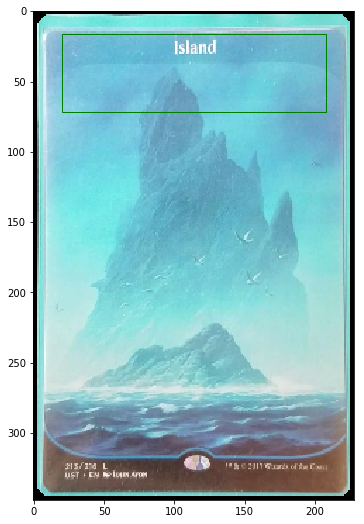

In [65]:
#Run a few times...
imgs_dir="data\\cards"
imgs_fns=glob(imgs_dir+"\\*\\*.png")
img_fn=random.choice(imgs_fns)
display_img(cv2.imread(img_fn,cv2.IMREAD_UNCHANGED),polygons=[refCornerHL,refCornerLR])

**Need to clean up zone space for text detection**

In [66]:
def findHull(img, corner=refCornerHL, debug="no"):
    """
        Find in the zone 'corner' of image 'img' and return, the convex hull delimiting
        the value and suit symbols
        'corner' (shape (4,2)) is an array of 4 points delimiting a rectangular zone, 
        takes one of the 2 possible values : refCornerHL or refCornerLR
        debug=
    """
    
    kernel = np.ones((3,3),np.uint8)
    corner=corner.astype(np.int)

    # We will focus on the zone of 'img' delimited by 'corner'
    x1=int(corner[0][0])
    y1=int(corner[0][1])
    x2=int(corner[2][0])
    y2=int(corner[2][1])
    w=x2-x1
    h=y2-y1
    zone=img[y1:y2,x1:x2].copy()

    strange_cnt=np.zeros_like(zone)
    gray=cv2.cvtColor(zone,cv2.COLOR_BGR2GRAY)
    bilateral=cv2.bilateralFilter(gray,20,10,100)#<---added
    ret,thresh=cv2.threshold(bilateral,157,220,cv2.THRESH_TOZERO)#<----added
    thld=cv2.Canny(thresh,30,200)
    thld = cv2.dilate(thld,kernel,iterations=1)
    if debug!="no": plt.imshow(thld)
    
    # Find the contours
    _,contours,_=cv2.findContours(thld.copy(),cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

    min_area=75 # We will reject contours with small area. TWEAK, 'zoom' dependant
    min_solidity=0.2 # Reject contours with a low solidity. TWEAK
    
    concat_contour=None # We will aggregate in 'concat_contour' the contours that we want to keep
    
    ok=True
    for c in contours:
        area=cv2.contourArea(c)

        hull = cv2.convexHull(c)
        hull_area = cv2.contourArea(hull)
        #print(hull_area)
        solidity = float(area)/hull_area#<----
        # Determine the center of gravity (cx,cy) of the contour
        M=cv2.moments(c)
        cx=int(M['m10']/M['m00'])
        cy=int(M['m01']/M['m00'])
        #  abs(w/2-cx)<w*0.3 and abs(h/2-cy)<h*0.4 : TWEAK, the idea here is to keep only the contours which are closed to the center of the zone
        if area >= min_area and abs(w/2-cx)<w*0.3 and abs(h/2-cy)<h*0.4 and solidity>min_solidity:
            if debug != "no" :
                cv2.drawContours(zone,[c],0,(255,0,0),-1)
            if concat_contour is None:
                concat_contour=c
            else:
                concat_contour=np.concatenate((concat_contour,c))
        if debug != "no" and solidity <= min_solidity :
            print("Solidity",solidity)
            cv2.drawContours(strange_cnt,[c],0,255,2)
            plt.imshow(strange_cnt)
            
     
    if concat_contour is not None:
        # At this point, we suppose that 'concat_contour' contains only the contours corresponding the value and suit symbols   
        # We can now determine the hull
        hull=cv2.convexHull(concat_contour)
        hull_area=cv2.contourArea(hull)
        # If the area of the hull is to small or too big, there may be a problem
        min_hull_area=1000 # TWEAK, deck and 'zoom' dependant
        max_hull_area=10000 # TWEAK, deck and 'zoom' dependant
        if hull_area < min_hull_area or hull_area > max_hull_area: 
            ok=False
            if debug!="no":
                print("Hull area=",hull_area,"too large or too small")
        # So far, the coordinates of the hull are relative to 'zone'
        # We need the coordinates relative to the image -> 'hull_in_img' 
        hull_in_img=hull+corner[0]

    else:
        ok=False
    
    
    if debug != "no" :
        if concat_contour is not None:
            cv2.drawContours(zone,[hull],0,(0,255,0),1)
            cv2.drawContours(img,[hull_in_img],0,(0,255,0),1)
        plt.imshow(zone)
        plt.imshow(img)
        if ok and debug!="pause_always":
            key=cv2.waitKey(1)
        else:
            key=cv2.waitKey(0)
        if key==27:
            return None
    if ok == False:
        
        return None
    
    return hull_in_img

In [67]:
# Test find_hull on a random card image
# debug = "no" or "pause_always" or "pause_on_pb"
# If debug!="no", you may have to press a key to continue execution after pause
debug="no" 
imgs_dir="data\\cards"
imgs_fns=glob(imgs_dir+"\\*\\*.png")
img_fn=random.choice(imgs_fns)
print(img_fn)
img=cv2.imread(img_fn,cv2.IMREAD_UNCHANGED)
hullHL=findHull(img,refCornerHL,debug=debug)
hullLR=findHull(img,refCornerLR,debug=debug)
display_img(img,[refCornerHL,refCornerLR,hullHL,hullLR])

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

data\cards\Show_and_Tell\552196370.png


error: OpenCV(3.4.3) C:\projects\opencv-python\opencv\modules\imgproc\src\color.cpp:181: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


In [ ]:
CardNames[:15]

In [28]:
imgs_dir="data\\cards"

cards={}
for card in CardNames:
    card_name=card        
    card_dir=os.path.join(imgs_dir,card_name)
    if not os.path.isdir(card_dir):
        #print("!!!",card_dir,"does not exist !!!")
        continue
    #cards[card_name]=[]
    for f in glob(card_dir+"\\*.png"):
        img=cv2.imread(f,cv2.IMREAD_UNCHANGED)
        hullHL=findHull(img,refCornerHL,debug="no") 
        if hullHL is None: 
            print("File:",f,"not used.")
            continue
        hullLR=findHull(img,refCornerLR,debug="no") 
        if hullLR is None: 
            #print("File:",f,"not used.")
            continue
        # We store the image in "rgb" format (we don't need opencv anymore)
        img=cv2.cvtColor(img,cv2.COLOR_BGRA2RGBA)
        #cards[card_name].append((img,hullHL,hullLR))
        cards[card_name]=((img,hullHL,hullLR))
#    print("Nb images for",CardNames,":",len(cards[card_name]))

File: data\cards\Ancient_Tomb\045998881.png not used.
File: data\cards\Ancient_Tomb\049020477.png not used.
File: data\cards\Ancient_Tomb\053955929.png not used.
File: data\cards\Ancient_Tomb\068224470.png not used.
File: data\cards\Ancient_Tomb\073680515.png not used.
File: data\cards\Ancient_Tomb\077181448.png not used.
File: data\cards\Ancient_Tomb\098301919.png not used.
File: data\cards\Ancient_Tomb\102611284.png not used.
File: data\cards\Ancient_Tomb\115553905.png not used.
File: data\cards\Ancient_Tomb\128942878.png not used.
File: data\cards\Ancient_Tomb\136942875.png not used.
File: data\cards\Ancient_Tomb\163653939.png not used.
File: data\cards\Ancient_Tomb\169602832.png not used.
File: data\cards\Ancient_Tomb\178039472.png not used.
File: data\cards\Ancient_Tomb\179301804.png not used.
File: data\cards\Ancient_Tomb\180921570.png not used.
File: data\cards\Ancient_Tomb\191607013.png not used.
File: data\cards\Ancient_Tomb\191968928.png not used.
File: data\cards\Ancient_Tom

File: data\cards\Brainstorm\985140791.png not used.
File: data\cards\Brainstorm\992113803.png not used.
File: data\cards\City_of_Traitors\011440819.png not used.
File: data\cards\City_of_Traitors\048934976.png not used.
File: data\cards\City_of_Traitors\055407950.png not used.
File: data\cards\City_of_Traitors\059976201.png not used.
File: data\cards\City_of_Traitors\091327458.png not used.
File: data\cards\City_of_Traitors\092645292.png not used.
File: data\cards\City_of_Traitors\097318793.png not used.
File: data\cards\City_of_Traitors\099423203.png not used.
File: data\cards\City_of_Traitors\100062233.png not used.
File: data\cards\City_of_Traitors\102561874.png not used.
File: data\cards\City_of_Traitors\115130988.png not used.
File: data\cards\City_of_Traitors\123324963.png not used.
File: data\cards\City_of_Traitors\123551224.png not used.
File: data\cards\City_of_Traitors\125472229.png not used.
File: data\cards\City_of_Traitors\129193654.png not used.
File: data\cards\City_of_T

File: data\cards\Flusterstorm\304093606.png not used.
File: data\cards\Flusterstorm\313650967.png not used.
File: data\cards\Flusterstorm\347870998.png not used.
File: data\cards\Flusterstorm\360035617.png not used.
File: data\cards\Flusterstorm\387753292.png not used.
File: data\cards\Flusterstorm\424086862.png not used.
File: data\cards\Flusterstorm\427997073.png not used.
File: data\cards\Flusterstorm\442833332.png not used.
File: data\cards\Flusterstorm\481779894.png not used.
File: data\cards\Flusterstorm\491742350.png not used.
File: data\cards\Flusterstorm\492184175.png not used.
File: data\cards\Flusterstorm\535122935.png not used.
File: data\cards\Flusterstorm\536686669.png not used.
File: data\cards\Flusterstorm\537067062.png not used.
File: data\cards\Flusterstorm\548441119.png not used.
File: data\cards\Flusterstorm\557008130.png not used.
File: data\cards\Flusterstorm\560473061.png not used.
File: data\cards\Flusterstorm\564315518.png not used.
File: data\cards\Flusterstor

File: data\cards\Island\528322015.png not used.
File: data\cards\Island\564476011.png not used.
File: data\cards\Island\570760575.png not used.
File: data\cards\Island\600343104.png not used.
File: data\cards\Island\614047003.png not used.
File: data\cards\Island\618631758.png not used.
File: data\cards\Island\652626113.png not used.
File: data\cards\Island\679280841.png not used.
File: data\cards\Island\685367923.png not used.
File: data\cards\Island\704319546.png not used.
File: data\cards\Island\706080887.png not used.
File: data\cards\Island\731037365.png not used.
File: data\cards\Island\797157797.png not used.
File: data\cards\Island\817846283.png not used.
File: data\cards\Island\822037091.png not used.
File: data\cards\Island\848723481.png not used.
File: data\cards\Island\907244755.png not used.
File: data\cards\Island\924602308.png not used.
File: data\cards\Island\966117017.png not used.
File: data\cards\Island\967530165.png not used.
File: data\cards\Lotus_Petal\039327026.p

File: data\cards\Polluted_Delta\387807417.png not used.
File: data\cards\Polluted_Delta\403921622.png not used.
File: data\cards\Polluted_Delta\418438067.png not used.
File: data\cards\Polluted_Delta\438220380.png not used.
File: data\cards\Polluted_Delta\442221540.png not used.
File: data\cards\Polluted_Delta\445285220.png not used.
File: data\cards\Polluted_Delta\452092961.png not used.
File: data\cards\Polluted_Delta\464805110.png not used.
File: data\cards\Polluted_Delta\466394369.png not used.
File: data\cards\Polluted_Delta\473222136.png not used.
File: data\cards\Polluted_Delta\475806595.png not used.
File: data\cards\Polluted_Delta\479818246.png not used.
File: data\cards\Polluted_Delta\484843358.png not used.
File: data\cards\Polluted_Delta\488743935.png not used.
File: data\cards\Polluted_Delta\497705371.png not used.
File: data\cards\Polluted_Delta\498641786.png not used.
File: data\cards\Polluted_Delta\500826946.png not used.
File: data\cards\Polluted_Delta\508855291.png no

File: data\cards\Sneak_Attack\141115050.png not used.
File: data\cards\Sneak_Attack\187522490.png not used.
File: data\cards\Sneak_Attack\191246432.png not used.
File: data\cards\Sneak_Attack\203026227.png not used.
File: data\cards\Sneak_Attack\213766134.png not used.
File: data\cards\Sneak_Attack\216580755.png not used.
File: data\cards\Sneak_Attack\226131638.png not used.
File: data\cards\Sneak_Attack\231738034.png not used.
File: data\cards\Sneak_Attack\242615000.png not used.
File: data\cards\Sneak_Attack\255883221.png not used.
File: data\cards\Sneak_Attack\306639022.png not used.
File: data\cards\Sneak_Attack\308460970.png not used.
File: data\cards\Sneak_Attack\309715424.png not used.
File: data\cards\Sneak_Attack\310016980.png not used.
File: data\cards\Sneak_Attack\322517934.png not used.
File: data\cards\Sneak_Attack\337667052.png not used.
File: data\cards\Sneak_Attack\339952506.png not used.
File: data\cards\Sneak_Attack\340631404.png not used.
File: data\cards\Sneak_Attac

File: data\cards\Wooded_Foothills\034471852.png not used.
File: data\cards\Wooded_Foothills\047966982.png not used.
File: data\cards\Wooded_Foothills\049294763.png not used.
File: data\cards\Wooded_Foothills\052071558.png not used.
File: data\cards\Wooded_Foothills\054601282.png not used.
File: data\cards\Wooded_Foothills\061741579.png not used.
File: data\cards\Wooded_Foothills\062391374.png not used.
File: data\cards\Wooded_Foothills\062453231.png not used.
File: data\cards\Wooded_Foothills\063472720.png not used.
File: data\cards\Wooded_Foothills\064379708.png not used.
File: data\cards\Wooded_Foothills\077765408.png not used.
File: data\cards\Wooded_Foothills\084170712.png not used.
File: data\cards\Wooded_Foothills\084804504.png not used.
File: data\cards\Wooded_Foothills\084898398.png not used.
File: data\cards\Wooded_Foothills\085598043.png not used.
File: data\cards\Wooded_Foothills\087774694.png not used.
File: data\cards\Wooded_Foothills\106079310.png not used.
File: data\car

In [29]:
cards.keys()

dict_keys(['Island', 'Mountain'])

In [30]:
cards['Island'][2]

array([[[207, 282]],

       [[204, 283]],

       [[ 90, 305]],

       [[ 81, 305]],

       [[ 66, 300]],

       [[ 34, 288]],

       [[ 20, 279]],

       [[ 20, 276]],

       [[ 36, 263]],

       [[ 39, 261]],

       [[ 74, 240]],

       [[125, 222]],

       [[133, 222]],

       [[207, 272]]])

In [31]:
print("Saved in :",cards_pck_fn)
pickle.dump(cards,open(cards_pck_fn,'wb'))

Saved in : data\cards.pck


In [32]:
class Cards():
    def __init__(self,cards_pck_fn=cards_pck_fn):
        self._cards=pickle.load(open(cards_pck_fn,'rb'))
        # self._cards is a dictionary where keys are card names and values are lists of (img,hullHL,hullLR) 
        self._nb_cards_by_value={k:len(self._cards[k]) for k in self._cards}
        print("Nb of cards loaded per name :", self._nb_cards_by_value)
        
    def get_random(self, card_name=None, display=False):
        if card_name is None:
            card_name= random.choice(list(self._cards.keys()))
        card,hull1,hull2=self._cards[card_name]#
        [random.randint(0,self._nb_cards_by_value[card_name]-1)]
        print(card_name)
        if display:
            if display: display_img(card,[hull1,hull2],"rgb")
        return card,card_name,hull1,hull2
    
cardlist = Cards()

Nb of cards loaded per name : {'Island': 3, 'Mountain': 3}


Mountain


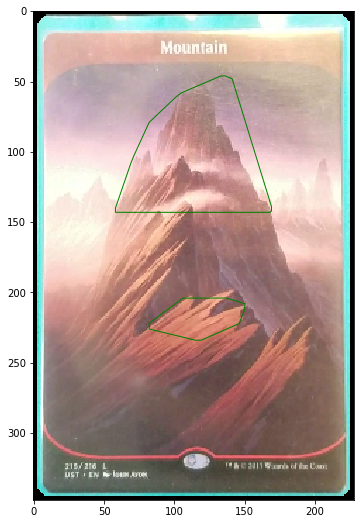

In [45]:
# Test: display a random card
_=cardlist.get_random(display=True)
# Display a random Ace of spades
#_=cards.get_random("As",display=True)

In [92]:
xml_body_1="""<annotation>
        <folder>FOLDER</folder>
        <filename>{FILENAME}</filename>
        <path>{PATH}</path>
        <source>
                <database>Unknown</database>
        </source>
        <size>
                <width>{WIDTH}</width>
                <height>{HEIGHT}</height>
                <depth>3</depth>
        </size>
"""
xml_object=""" <object>
                <name>{CLASS}</name>
                <pose>Unspecified</pose>
                <truncated>0</truncated>
                <difficult>0</difficult>
                <bndbox>
                        <xmin>{XMIN}</xmin>
                        <ymin>{YMIN}</ymin>
                        <xmax>{XMAX}</xmax>
                        <ymax>{YMAX}</ymax>
                </bndbox>
        </object>
"""
xml_body_2="""</annotation>        
"""

def create_voc_xml(xml_file, img_file,listbba,display=False):
    with open(xml_file,"w") as f:
        f.write(xml_body_1.format(**{'FILENAME':os.path.basename(img_file), 'PATH':img_file,'WIDTH':imgW,'HEIGHT':imgH}))
        for bba in listbba:            
            f.write(xml_object.format(**{'CLASS':bba.classname,'XMIN':bba.x1,'YMIN':bba.y1,'XMAX':bba.x2,'YMAX':bba.y2}))
        f.write(xml_body_2)
        if display: print("New xml",xml_file)

In [93]:
# Scenario with 2 cards:
# The original image of a card has the shape (cardH,cardW,4)
# We first paste it in a zero image of shape (imgH,imgW,4) at position decalX, decalY
# so that the original image is centerd in the zero image
decalX=int((imgW-cardW)/2)      #((720-228)/2)=246
decalY=int((imgH-cardH)/2)      #((720-348)/2)=186

# Scenario with 3 cards : decal values are different
decalX3=int(imgW/2)#720/2=360
decalY3=int(imgH/2-cardH)#360-348=12


In [94]:
def kps_to_polygon(kps):
    """
        Convert imgaug keypoints to shapely polygon
    """
    pts=[(kp.x,kp.y) for kp in kps]
    return Polygon(pts)

In [95]:
def hull_to_kps(hull, decalX=decalX, decalY=decalY):
    """
        Convert hull to imgaug keypoints
    """
    # hull is a cv2.Contour, shape : Nx1x2
    kps=[ia.Keypoint(x=p[0]+decalX,y=p[1]+decalY) for p in hull.reshape(-1,2)]
    kps=ia.KeypointsOnImage(kps, shape=(imgH,imgW,3))
    return kps

In [96]:
def kps_to_BB(kps):
    """
        Determine imgaug bounding box from imgaug keypoints
    """
    extend=3 # To make the bounding box a little bit bigger
    kpsx=[kp.x for kp in kps.keypoints]
    minx=max(0,int(min(kpsx)-extend))
    maxx=min(imgW,int(max(kpsx)+extend))
    kpsy=[kp.y for kp in kps.keypoints]
    miny=max(0,int(min(kpsy)-extend))
    maxy=min(imgH,int(max(kpsy)+extend))
    if minx==maxx or miny==maxy:
        return None
    else:
        return ia.BoundingBox(x1=minx,y1=miny,x2=maxx,y2=maxy)

In [97]:
# imgaug keypoints of the bounding box of a whole card
cardKP = ia.KeypointsOnImage([    
    ia.Keypoint(x=decalX,y=decalY),
    ia.Keypoint(x=decalX+cardW,y=decalY),   
    ia.Keypoint(x=decalX+cardW,y=decalY+cardH),
    ia.Keypoint(x=decalX,y=decalY+cardH)
    ], shape=(imgH,imgW,3))
    #Keypoint(x=-96.00000000, y=-336.00000000)
    #Keypoint(x=132.00000000, y=-336.00000000)
    #Keypoint(x=132.00000000, y=12.00000000)
    #Keypoint(x=-96.00000000, y=12.00000000)
    #shape=(720, 720, 3)

In [98]:
# imgaug transformation for one card in scenario with 2 cards
transform_1card = iaa.Sequential([
    iaa.Affine(scale=[0.65,1]),
    iaa.Affine(rotate=(-180,180)),
    iaa.Affine(translate_percent={"x":(-0.25,0.25),"y":(-0.25,0.25)}),])

In [99]:
# For the 3 cards scenario, we use 3 imgaug transforms, the first 2 are for individual cards, 
# and the third one for the group of 3 cards
trans_rot1 = iaa.Sequential([
    iaa.Affine(translate_px={"x": (10, 20)}),
    iaa.Affine(rotate=(22,30))])

trans_rot2 = iaa.Sequential([
    iaa.Affine(translate_px={"x": (0, 5)}),
    iaa.Affine(rotate=(10,15))])

transform_3cards = iaa.Sequential([
    iaa.Affine(translate_px={"x":decalX-decalX3,"y":decalY-decalY3}),
    iaa.Affine(scale=[0.65,1]),
    iaa.Affine(rotate=(-180,180)),
    iaa.Affine(translate_percent={"x":(-0.2,0.2),"y":(-0.2,0.2)})   ])

In [100]:
# imgaug transformation for the background
scaleBg=iaa.Scale({"height": imgH, "width": imgW})
scaleBg

Scale(name=UnnamedScale, parameters=[(Deterministic(int 720), Deterministic(int 720)), Deterministic(cubic)], deterministic=False)

In [101]:
def augment(img, list_kps, seq, restart=True):
    """
        Apply augmentation 'seq' to image 'img' and keypoints 'list_kps'
        If restart is False, the augmentation has been made deterministic outside the function (used for 3 cards scenario)
    """ 
    # Make sequence deterministic
    while True:
        if restart:
            myseq=seq.to_deterministic()
        else:
            myseq=seq
        # Augment image, keypoints and bbs 
        img_aug = myseq.augment_images([img])[0]
        list_kps_aug = [myseq.augment_keypoints([kp])[0] for kp in list_kps]
        list_bbs = [kps_to_BB(list_kps_aug[1]),kps_to_BB(list_kps_aug[2])]
        valid=True
        # Check the card bounding box stays inside the image
        for bb in list_bbs:
            if bb is None or int(round(bb.x2)) >= imgW or int(round(bb.y2)) >= imgH or int(bb.x1)<=0 or int(bb.y1)<=0:
                valid=False
                break
        if valid: break
        elif not restart:
            img_aug=None
            break
                
    return img_aug,list_kps_aug,list_bbs

In [102]:
class BBA:  # Bounding box + annotations
    def __init__(self,bb,classname):      
        self.x1=int(round(bb.x1))
        self.y1=int(round(bb.y1))
        self.x2=int(round(bb.x2))
        self.y2=int(round(bb.y2))
        self.classname=classname

In [103]:
#ValueError: could not broadcast input array from shape (348,228,4) into shape (336,96,4)
#-336 : -336+1392=1056,    -96:-96+912=816
#decalY:decalY+cardH,decalX:decalX+cardW,:

In [104]:
class Scene:
    def __init__(self,bg,img1, class1, hulla1,hullb1,img2, class2,hulla2,hullb2,img3=None, class3=None,hulla3=None,hullb3=None):
        if img3 is not None:
            self.create3CardsScene(bg,img1, class1, hulla1,hullb1,img2, class2,hulla2,hullb2,img3, class3,hulla3,hullb3)
        else:
            self.create2CardsScene(bg,img1, class1, hulla1,hullb1,img2, class2,hulla2,hullb2)

    def create2CardsScene(self,bg,img1, class1, hulla1,hullb1,img2, class2,hulla2,hullb2):
        kpsa1=hull_to_kps(hulla1)
        kpsb1=hull_to_kps(hullb1)
        kpsa2=hull_to_kps(hulla2)
        kpsb2=hull_to_kps(hullb2)
        
        # Randomly transform 1st card
        self.img1=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img1[decalY:decalY+cardH,decalX:decalX+cardW,:]=img1#<-----
        self.img1,self.lkps1,self.bbs1=augment(self.img1,[cardKP,kpsa1,kpsb1],transform_1card)

        # Randomly transform 2nd card. We want that card 2 does not partially cover a corner of 1 card.
        # If so, we apply a new random transform to card 2
        while True:
            self.listbba=[]
            self.img2=np.zeros((imgH,imgW,4),dtype=np.uint8)
            self.img2[decalY:decalY+cardH,decalX:decalX+cardW,:]=img2
            self.img2,self.lkps2,self.bbs2=augment(self.img2,[cardKP,kpsa2,kpsb2],transform_1card)

            # mainPoly2: shapely polygon of card 2
            mainPoly2=kps_to_polygon(self.lkps2[0].keypoints[0:4])
            invalid=False
            intersect_ratio=0.1
            for i in range(1,3):
                # smallPoly1: shapely polygon of one of the hull of card 1
                smallPoly1=kps_to_polygon(self.lkps1[i].keypoints[:])
                a=smallPoly1.area
                # We calculate area of the intersection of card 1 corner with card 2
                intersect=mainPoly2.intersection(smallPoly1)
                ai=intersect.area
                # If intersection area is small enough, we accept card 2
                if (a-ai)/a > 1-intersect_ratio:
                    self.listbba.append(BBA(self.bbs1[i-1],class1))
                # If intersectio area is not small, but also not big enough, we want apply new transform to card 2
                elif (a-ai)/a>intersect_ratio:
                    invalid=True
                    break
                    
            if not invalid: break
            
        self.class1=class1
        self.class2=class2
        for bb in self.bbs2:
            self.listbba.append(BBA(bb,class2))
        # Construct final image of the scene by superimposing: bg, img1 and img2
        self.bg=scaleBg.augment_image(bg)
        mask1=self.img1[:,:,3]
        self.mask1=np.stack([mask1]*3,-1)
        self.final=np.where(self.mask1,self.img1[:,:,0:3],self.bg)
        mask2=self.img2[:,:,3]
        self.mask2=np.stack([mask2]*3,-1)
        self.final=np.where(self.mask2,self.img2[:,:,0:3],self.final)
        
        
        
    def create3CardsScene(self,bg,img1, class1, hulla1,hullb1,img2, class2,hulla2,hullb2,img3, class3,hulla3,hullb3):
        
        kpsa1=hull_to_kps(hulla1,decalX3,decalY3)
        kpsb1=hull_to_kps(hullb1,decalX3,decalY3)
        kpsa2=hull_to_kps(hulla2,decalX3,decalY3)
        kpsb2=hull_to_kps(hullb2,decalX3,decalY3)
        kpsa3=hull_to_kps(hulla3,decalX3,decalY3)
        kpsb3=hull_to_kps(hullb3,decalX3,decalY3)
        self.img3=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img3[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img3
        self.img3,self.lkps3,self.bbs3=augment(self.img3,[cardKP,kpsa3,kpsb3],trans_rot1)
        self.img2=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img2[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img2
        self.img2,self.lkps2,self.bbs2=augment(self.img2,[cardKP,kpsa2,kpsb2],trans_rot2)
        self.img1=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img1[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img1

        while True:
            det_transform_3cards = transform_3cards.to_deterministic()
            _img3,_lkps3,self.bbs3=augment(self.img3,self.lkps3,det_transform_3cards, False)
            if _img3 is None: continue
            _img2,_lkps2,self.bbs2=augment(self.img2,self.lkps2,det_transform_3cards, False)
            if _img2 is None: continue
            _img1,self.lkps1,self.bbs1=augment(self.img1,[cardKP,kpsa1,kpsb1],det_transform_3cards, False)
            if _img1 is None: continue
            break
        self.img3=_img3
        self.lkps3=_lkps3
        self.img2=_img2
        self.lkps2=_lkps2
        self.img1=_img1
        
        self.class1=class1
        self.class2=class2
        self.class3=class3
        self.listbba=[BBA(self.bbs1[0],class1),BBA(self.bbs2[0],class2),BBA(self.bbs3[0],class3),BBA(self.bbs3[1],class3)]
        
        # Construct final image of the scene by superimposing: bg, img1, img2 and img3
        self.bg=scaleBg.augment_image(bg)
        mask1=self.img1[:,:,3]
        self.mask1=np.stack([mask1]*3,-1)
        self.final=np.where(self.mask1,self.img1[:,:,0:3],self.bg)
        mask2=self.img2[:,:,3]
        self.mask2=np.stack([mask2]*3,-1)
        self.final=np.where(self.mask2,self.img2[:,:,0:3],self.final)
        mask3=self.img3[:,:,3]
        self.mask3=np.stack([mask3]*3,-1)
        self.final=np.where(self.mask3,self.img3[:,:,0:3],self.final)

    def display(self):
        fig,ax=plt.subplots(1,figsize=(8,8))
        ax.imshow(self.final)
        for bb in self.listbba:
            rect=patches.Rectangle((bb.x1,bb.y1),bb.x2-bb.x1,bb.y2-bb.y1,linewidth=1,edgecolor='b',facecolor='none')
            ax.add_patch(rect)
    def res(self):
        return self.final
    def write_files(self,save_dir,display=False):
        jpg_fn, xml_fn=give_me_filename(save_dir, ["jpg","xml"])
        plt.imsave(jpg_fn,self.final)
        if display: print("New image saved in",jpg_fn)
        create_voc_xml(xml_fn,jpg_fn, self.listbba,display=display)

In [109]:
# Test generation of a scene with 2 cards
bg=backgrounds.get_random()

In [110]:
img1,card_val1,hulla1,hullb1=cardlist.get_random()

Island


In [111]:
img2,card_val2,hulla2,hullb2=cardlist.get_random()

Wooded_Foothills


In [112]:
newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2)

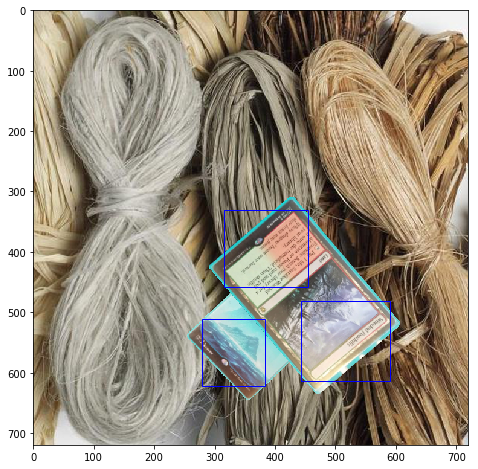

In [113]:

newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2)
newimg.display()

Emrakul_the_Aeons_Torn
Ponder
Griselbrand


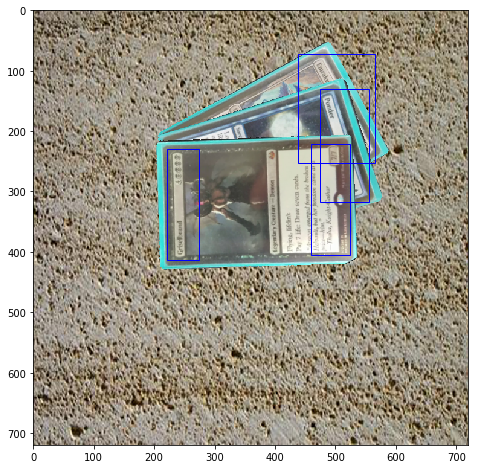

In [114]:
# Test generation of a scene with 3 cards
bg=backgrounds.get_random()
img1,card_val1,hulla1,hullb1=cardlist.get_random()
img2,card_val2,hulla2,hullb2=cardlist.get_random()
img3,card_val3,hulla3,hullb3=cardlist.get_random()

newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2,img3,card_val3,hulla3,hullb3)
newimg.display()

In [115]:
nb_cards_to_generate=100
save_dir="data\\scenes\\val"

if not os.path.isdir(save_dir):
    os.makedirs(save_dir)

for i in tqdm(range(nb_cards_to_generate)):
    bg=backgrounds.get_random()
    img1,card_val1,hulla1,hullb1=cardlist.get_random()
    img2,card_val2,hulla2,hullb2=cardlist.get_random()
    
    newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2)
    newimg.write_files(save_dir)

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Polluted_Delta
Spell_Pierce


  1%|▊                                                                                 | 1/100 [00:00<00:19,  4.98it/s]

Island
Polluted_Delta


  2%|█▋                                                                                | 2/100 [00:00<00:20,  4.72it/s]

Intuition
Lotus_Petal


  3%|██▍                                                                               | 3/100 [00:00<00:19,  4.90it/s]

Ancient_Tomb
Force_of_Will


  4%|███▎                                                                              | 4/100 [00:00<00:18,  5.10it/s]

Taiga
Wooded_Foothills


  5%|████                                                                              | 5/100 [00:00<00:18,  5.24it/s]

Wooded_Foothills
Polluted_Delta


  6%|████▉                                                                             | 6/100 [00:01<00:19,  4.75it/s]

Taiga
Taiga


  7%|█████▋                                                                            | 7/100 [00:01<00:20,  4.65it/s]

Emrakul_the_Aeons_Torn
Flusterstorm


  8%|██████▌                                                                           | 8/100 [00:01<00:24,  3.83it/s]

Wooded_Foothills
Scalding_Tarn


  9%|███████▍                                                                          | 9/100 [00:01<00:21,  4.30it/s]

Ancient_Tomb
Volcanic_Island


 10%|████████                                                                         | 10/100 [00:02<00:19,  4.73it/s]

Ancient_Tomb
Ancient_Tomb


 11%|████████▉                                                                        | 11/100 [00:02<00:18,  4.75it/s]

Griselbrand
Omniscience


 12%|█████████▋                                                                       | 12/100 [00:02<00:17,  5.02it/s]

Ponder
Brainstorm


 13%|██████████▌                                                                      | 13/100 [00:02<00:18,  4.80it/s]

Spell_Pierce
Brainstorm


 14%|███████████▎                                                                     | 14/100 [00:02<00:16,  5.11it/s]

Taiga
Scalding_Tarn


 15%|████████████▏                                                                    | 15/100 [00:03<00:15,  5.45it/s]

Show_and_Tell
Ponder


 16%|████████████▉                                                                    | 16/100 [00:03<00:15,  5.52it/s]

Spell_Pierce
Griselbrand


 17%|█████████████▊                                                                   | 17/100 [00:03<00:15,  5.20it/s]

Ancient_Tomb
Cunning_Wish


 18%|██████████████▌                                                                  | 18/100 [00:03<00:17,  4.77it/s]

Ancient_Tomb
Emrakul_the_Aeons_Torn


 19%|███████████████▍                                                                 | 19/100 [00:04<00:19,  4.14it/s]

Lotus_Petal
Cunning_Wish


 20%|████████████████▏                                                                | 20/100 [00:04<00:25,  3.20it/s]

Ponder
Lotus_Petal


 21%|█████████████████                                                                | 21/100 [00:04<00:21,  3.61it/s]

Volcanic_Island
Spell_Pierce


 22%|█████████████████▊                                                               | 22/100 [00:04<00:20,  3.90it/s]

Wooded_Foothills
Sneak_Attack


 23%|██████████████████▋                                                              | 23/100 [00:05<00:18,  4.15it/s]

Misty_Rainforest
Ponder


 24%|███████████████████▍                                                             | 24/100 [00:05<00:16,  4.55it/s]

Misty_Rainforest
Sneak_Attack


 25%|████████████████████▎                                                            | 25/100 [00:05<00:19,  3.82it/s]

Ancient_Tomb
Taiga


 26%|█████████████████████                                                            | 26/100 [00:05<00:19,  3.79it/s]

Emrakul_the_Aeons_Torn
Polluted_Delta


 27%|█████████████████████▊                                                           | 27/100 [00:06<00:17,  4.16it/s]

Force_of_Will
Emrakul_the_Aeons_Torn


 28%|██████████████████████▋                                                          | 28/100 [00:06<00:16,  4.40it/s]

Lotus_Petal
Lotus_Petal


 29%|███████████████████████▍                                                         | 29/100 [00:06<00:16,  4.32it/s]

Ancient_Tomb
City_of_Traitors


 30%|████████████████████████▎                                                        | 30/100 [00:06<00:15,  4.51it/s]

Ancient_Tomb
Scalding_Tarn


 31%|█████████████████████████                                                        | 31/100 [00:07<00:16,  4.27it/s]

Mountain
Lotus_Petal


 32%|█████████████████████████▉                                                       | 32/100 [00:07<00:14,  4.75it/s]

Brainstorm
City_of_Traitors


 33%|██████████████████████████▋                                                      | 33/100 [00:07<00:13,  4.86it/s]

Griselbrand
Griselbrand


 34%|███████████████████████████▌                                                     | 34/100 [00:07<00:12,  5.27it/s]

Scalding_Tarn
Ponder


 35%|████████████████████████████▎                                                    | 35/100 [00:07<00:12,  5.36it/s]

Force_of_Will
Cunning_Wish


 36%|█████████████████████████████▏                                                   | 36/100 [00:07<00:11,  5.46it/s]

Sneak_Attack
Misty_Rainforest


 37%|█████████████████████████████▉                                                   | 37/100 [00:08<00:11,  5.67it/s]

Brainstorm
Wooded_Foothills


 38%|██████████████████████████████▊                                                  | 38/100 [00:08<00:11,  5.55it/s]

Show_and_Tell
Spell_Pierce


 39%|███████████████████████████████▌                                                 | 39/100 [00:08<00:13,  4.53it/s]

Lotus_Petal
Griselbrand


 40%|████████████████████████████████▍                                                | 40/100 [00:08<00:12,  4.88it/s]

Force_of_Will
Mountain


 41%|█████████████████████████████████▏                                               | 41/100 [00:08<00:12,  4.83it/s]

Sneak_Attack
Polluted_Delta


 42%|██████████████████████████████████                                               | 42/100 [00:09<00:11,  5.20it/s]

Emrakul_the_Aeons_Torn
Wooded_Foothills


 43%|██████████████████████████████████▊                                              | 43/100 [00:09<00:10,  5.36it/s]

Spell_Pierce
Scalding_Tarn


 44%|███████████████████████████████████▋                                             | 44/100 [00:09<00:10,  5.47it/s]

Mountain
City_of_Traitors


 45%|████████████████████████████████████▍                                            | 45/100 [00:09<00:10,  5.39it/s]

Island
Brainstorm


 46%|█████████████████████████████████████▎                                           | 46/100 [00:09<00:10,  5.28it/s]

Emrakul_the_Aeons_Torn
Omniscience


 47%|██████████████████████████████████████                                           | 47/100 [00:10<00:10,  5.21it/s]

Ponder
Cunning_Wish


 48%|██████████████████████████████████████▉                                          | 48/100 [00:10<00:09,  5.46it/s]

Ponder
Show_and_Tell


 49%|███████████████████████████████████████▋                                         | 49/100 [00:10<00:12,  4.10it/s]

Show_and_Tell
Ancient_Tomb


 50%|████████████████████████████████████████▌                                        | 50/100 [00:10<00:13,  3.69it/s]

Intuition
Scalding_Tarn


 51%|█████████████████████████████████████████▎                                       | 51/100 [00:11<00:13,  3.59it/s]

Sneak_Attack
Wooded_Foothills


 52%|██████████████████████████████████████████                                       | 52/100 [00:11<00:12,  3.87it/s]

Misty_Rainforest
Island


 53%|██████████████████████████████████████████▉                                      | 53/100 [00:11<00:10,  4.31it/s]

Misty_Rainforest
Brainstorm


 54%|███████████████████████████████████████████▋                                     | 54/100 [00:11<00:10,  4.26it/s]

Show_and_Tell
Sneak_Attack


 55%|████████████████████████████████████████████▌                                    | 55/100 [00:12<00:12,  3.58it/s]

Brainstorm
Griselbrand


 56%|█████████████████████████████████████████████▎                                   | 56/100 [00:12<00:11,  3.79it/s]

Scalding_Tarn
Wooded_Foothills


 57%|██████████████████████████████████████████████▏                                  | 57/100 [00:12<00:11,  3.78it/s]

Ancient_Tomb
Taiga


 58%|██████████████████████████████████████████████▉                                  | 58/100 [00:13<00:13,  3.14it/s]

Lotus_Petal
Omniscience


 59%|███████████████████████████████████████████████▊                                 | 59/100 [00:13<00:11,  3.50it/s]

Flusterstorm
Ponder


 60%|████████████████████████████████████████████████▌                                | 60/100 [00:13<00:11,  3.36it/s]

Force_of_Will
Griselbrand


 61%|█████████████████████████████████████████████████▍                               | 61/100 [00:13<00:11,  3.43it/s]

Intuition
Ponder


 62%|██████████████████████████████████████████████████▏                              | 62/100 [00:14<00:14,  2.65it/s]

Griselbrand
Volcanic_Island


 63%|███████████████████████████████████████████████████                              | 63/100 [00:14<00:12,  2.92it/s]

Intuition
Griselbrand


 64%|███████████████████████████████████████████████████▊                             | 64/100 [00:15<00:11,  3.13it/s]

Sneak_Attack
Volcanic_Island


 65%|████████████████████████████████████████████████████▋                            | 65/100 [00:15<00:10,  3.19it/s]

Island
Flusterstorm


 66%|█████████████████████████████████████████████████████▍                           | 66/100 [00:15<00:10,  3.31it/s]

Intuition
Misty_Rainforest


 67%|██████████████████████████████████████████████████████▎                          | 67/100 [00:16<00:13,  2.48it/s]

Ancient_Tomb
Polluted_Delta


 68%|███████████████████████████████████████████████████████                          | 68/100 [00:16<00:12,  2.53it/s]

Taiga
Lotus_Petal


 69%|███████████████████████████████████████████████████████▉                         | 69/100 [00:16<00:11,  2.67it/s]

Griselbrand
Intuition


 70%|████████████████████████████████████████████████████████▋                        | 70/100 [00:17<00:10,  2.78it/s]

Misty_Rainforest
Emrakul_the_Aeons_Torn


 71%|█████████████████████████████████████████████████████████▌                       | 71/100 [00:17<00:11,  2.56it/s]

Wooded_Foothills
Brainstorm


 72%|██████████████████████████████████████████████████████████▎                      | 72/100 [00:18<00:09,  2.88it/s]

Scalding_Tarn
Emrakul_the_Aeons_Torn


 73%|███████████████████████████████████████████████████████████▏                     | 73/100 [00:18<00:08,  3.24it/s]

Show_and_Tell
Intuition


 74%|███████████████████████████████████████████████████████████▉                     | 74/100 [00:18<00:07,  3.65it/s]

Intuition
Force_of_Will


 75%|████████████████████████████████████████████████████████████▊                    | 75/100 [00:18<00:06,  3.87it/s]

Volcanic_Island
Scalding_Tarn


 76%|█████████████████████████████████████████████████████████████▌                   | 76/100 [00:19<00:07,  3.28it/s]

Griselbrand
Show_and_Tell


 77%|██████████████████████████████████████████████████████████████▎                  | 77/100 [00:19<00:07,  3.18it/s]

Force_of_Will
Misty_Rainforest


 78%|███████████████████████████████████████████████████████████████▏                 | 78/100 [00:19<00:06,  3.45it/s]

Brainstorm
Volcanic_Island


 79%|███████████████████████████████████████████████████████████████▉                 | 79/100 [00:19<00:05,  3.66it/s]

Polluted_Delta
Brainstorm


 80%|████████████████████████████████████████████████████████████████▊                | 80/100 [00:20<00:05,  3.69it/s]

Show_and_Tell
Omniscience


 81%|█████████████████████████████████████████████████████████████████▌               | 81/100 [00:20<00:04,  3.86it/s]

Volcanic_Island
Mountain


 82%|██████████████████████████████████████████████████████████████████▍              | 82/100 [00:20<00:04,  3.65it/s]

Lotus_Petal
Show_and_Tell


 83%|███████████████████████████████████████████████████████████████████▏             | 83/100 [00:20<00:04,  3.78it/s]

Ponder
Emrakul_the_Aeons_Torn


 84%|████████████████████████████████████████████████████████████████████             | 84/100 [00:21<00:03,  4.00it/s]

Taiga
Force_of_Will


 85%|████████████████████████████████████████████████████████████████████▊            | 85/100 [00:21<00:04,  3.32it/s]

Lotus_Petal
Ponder


 86%|█████████████████████████████████████████████████████████████████████▋           | 86/100 [00:21<00:03,  3.69it/s]

Emrakul_the_Aeons_Torn
Emrakul_the_Aeons_Torn


 87%|██████████████████████████████████████████████████████████████████████▍          | 87/100 [00:21<00:03,  3.94it/s]

Sneak_Attack
Flusterstorm


 88%|███████████████████████████████████████████████████████████████████████▎         | 88/100 [00:22<00:02,  4.17it/s]

Wooded_Foothills
City_of_Traitors


 89%|████████████████████████████████████████████████████████████████████████         | 89/100 [00:22<00:03,  3.50it/s]

Show_and_Tell
Force_of_Will


 90%|████████████████████████████████████████████████████████████████████████▉        | 90/100 [00:23<00:03,  3.00it/s]

Cunning_Wish
Ancient_Tomb


 91%|█████████████████████████████████████████████████████████████████████████▋       | 91/100 [00:23<00:03,  2.50it/s]

Spell_Pierce
Lotus_Petal


 92%|██████████████████████████████████████████████████████████████████████████▌      | 92/100 [00:23<00:02,  2.69it/s]

Ponder
Emrakul_the_Aeons_Torn


 93%|███████████████████████████████████████████████████████████████████████████▎     | 93/100 [00:24<00:02,  2.87it/s]

Lotus_Petal
Ponder


 94%|████████████████████████████████████████████████████████████████████████████▏    | 94/100 [00:24<00:01,  3.17it/s]

Cunning_Wish
Volcanic_Island


 95%|████████████████████████████████████████████████████████████████████████████▉    | 95/100 [00:24<00:01,  2.96it/s]

Wooded_Foothills
Omniscience


 96%|█████████████████████████████████████████████████████████████████████████████▊   | 96/100 [00:25<00:01,  2.72it/s]

Show_and_Tell
Taiga


 97%|██████████████████████████████████████████████████████████████████████████████▌  | 97/100 [00:25<00:00,  3.10it/s]

Volcanic_Island
Volcanic_Island


 98%|███████████████████████████████████████████████████████████████████████████████▍ | 98/100 [00:25<00:00,  2.97it/s]

City_of_Traitors
Show_and_Tell


 99%|████████████████████████████████████████████████████████████████████████████████▏| 99/100 [00:26<00:00,  3.03it/s]

Island
Ponder


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:26<00:00,  3.27it/s]


In [116]:
nb_cards_to_generate=100
save_dir="data\\scenes\\val"

if not os.path.isdir(save_dir):
    os.makedirs(save_dir)

for i in tqdm(range(nb_cards_to_generate)):
    bg=backgrounds.get_random()
    img1,card_val1,hulla1,hullb1=cardlist.get_random()
    img2,card_val2,hulla2,hullb2=cardlist.get_random()
    img3,card_val3,hulla3,hullb3=cardlist.get_random()
    
    newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2,img3,card_val3,hulla3,hullb3)
    newimg.write_files(save_dir)

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Brainstorm
Volcanic_Island
Taiga


  1%|▊                                                                                 | 1/100 [00:00<00:31,  3.10it/s]

Show_and_Tell
Mountain
Sneak_Attack


  2%|█▋                                                                                | 2/100 [00:00<00:32,  3.06it/s]

Flusterstorm
Show_and_Tell
Island


  3%|██▍                                                                               | 3/100 [00:00<00:29,  3.32it/s]

Spell_Pierce
Omniscience
Flusterstorm


  4%|███▎                                                                              | 4/100 [00:01<00:28,  3.40it/s]

Emrakul_the_Aeons_Torn
Island
Polluted_Delta


  5%|████                                                                              | 5/100 [00:01<00:33,  2.85it/s]

Flusterstorm
Flusterstorm
Volcanic_Island


  6%|████▉                                                                             | 6/100 [00:02<00:40,  2.33it/s]

Sneak_Attack
Scalding_Tarn
Taiga


  7%|█████▋                                                                            | 7/100 [00:02<00:39,  2.34it/s]

Force_of_Will
Lotus_Petal
Show_and_Tell


  8%|██████▌                                                                           | 8/100 [00:03<00:37,  2.43it/s]

Island
Island
Lotus_Petal


  9%|███████▍                                                                          | 9/100 [00:03<00:35,  2.55it/s]

Cunning_Wish
Sneak_Attack
Emrakul_the_Aeons_Torn


 10%|████████                                                                         | 10/100 [00:03<00:34,  2.61it/s]

Scalding_Tarn
City_of_Traitors
Island


 11%|████████▉                                                                        | 11/100 [00:04<00:34,  2.60it/s]

Cunning_Wish
Force_of_Will
Flusterstorm


 12%|█████████▋                                                                       | 12/100 [00:04<00:41,  2.11it/s]

Omniscience
Sneak_Attack
Taiga


 13%|██████████▌                                                                      | 13/100 [00:05<00:40,  2.15it/s]

Griselbrand
Lotus_Petal
Taiga


 14%|███████████▎                                                                     | 14/100 [00:05<00:39,  2.16it/s]

Misty_Rainforest
Taiga
Ancient_Tomb


 15%|████████████▏                                                                    | 15/100 [00:06<00:38,  2.19it/s]

Sneak_Attack
Ancient_Tomb
Wooded_Foothills


 16%|████████████▉                                                                    | 16/100 [00:06<00:40,  2.09it/s]

Mountain
Polluted_Delta
Mountain


 17%|█████████████▊                                                                   | 17/100 [00:07<00:38,  2.14it/s]

Volcanic_Island
Flusterstorm
Brainstorm


 18%|██████████████▌                                                                  | 18/100 [00:07<00:39,  2.09it/s]

Misty_Rainforest
Ancient_Tomb
Misty_Rainforest


 19%|███████████████▍                                                                 | 19/100 [00:08<00:36,  2.19it/s]

Brainstorm
Wooded_Foothills
Emrakul_the_Aeons_Torn


 20%|████████████████▏                                                                | 20/100 [00:08<00:35,  2.24it/s]

Spell_Pierce
Volcanic_Island
Force_of_Will


 21%|█████████████████                                                                | 21/100 [00:08<00:35,  2.23it/s]

Force_of_Will
Cunning_Wish
Sneak_Attack


 22%|█████████████████▊                                                               | 22/100 [00:09<00:33,  2.34it/s]

Wooded_Foothills
Lotus_Petal
Sneak_Attack


 23%|██████████████████▋                                                              | 23/100 [00:09<00:32,  2.38it/s]

Intuition
Cunning_Wish
Lotus_Petal


 24%|███████████████████▍                                                             | 24/100 [00:10<00:34,  2.23it/s]

Volcanic_Island
Flusterstorm
Mountain


 25%|████████████████████▎                                                            | 25/100 [00:10<00:40,  1.85it/s]

Polluted_Delta
Ancient_Tomb
Taiga


 26%|█████████████████████                                                            | 26/100 [00:11<00:37,  1.99it/s]

Sneak_Attack
Show_and_Tell
Ponder


 27%|█████████████████████▊                                                           | 27/100 [00:11<00:36,  1.99it/s]

Lotus_Petal
Cunning_Wish
City_of_Traitors


 28%|██████████████████████▋                                                          | 28/100 [00:12<00:37,  1.91it/s]

Griselbrand
Ancient_Tomb
Flusterstorm


 29%|███████████████████████▍                                                         | 29/100 [00:12<00:36,  1.95it/s]

Show_and_Tell
Force_of_Will
Sneak_Attack


 30%|████████████████████████▎                                                        | 30/100 [00:13<00:34,  2.02it/s]

Force_of_Will
Sneak_Attack
Polluted_Delta


 31%|█████████████████████████                                                        | 31/100 [00:13<00:31,  2.18it/s]

Emrakul_the_Aeons_Torn
Mountain
Brainstorm


 32%|█████████████████████████▉                                                       | 32/100 [00:14<00:29,  2.28it/s]

City_of_Traitors
Griselbrand
Island


 33%|██████████████████████████▋                                                      | 33/100 [00:14<00:26,  2.49it/s]

Ponder
Volcanic_Island
Lotus_Petal


 34%|███████████████████████████▌                                                     | 34/100 [00:14<00:23,  2.78it/s]

Ancient_Tomb
Polluted_Delta
Polluted_Delta


 35%|████████████████████████████▎                                                    | 35/100 [00:15<00:23,  2.76it/s]

Misty_Rainforest
Cunning_Wish
Intuition


 36%|█████████████████████████████▏                                                   | 36/100 [00:15<00:21,  2.96it/s]

Taiga
Show_and_Tell
Polluted_Delta


 37%|█████████████████████████████▉                                                   | 37/100 [00:15<00:19,  3.19it/s]

Intuition
Mountain
Ancient_Tomb


 38%|██████████████████████████████▊                                                  | 38/100 [00:15<00:18,  3.38it/s]

Mountain
Scalding_Tarn
Cunning_Wish


 39%|███████████████████████████████▌                                                 | 39/100 [00:16<00:17,  3.58it/s]

Show_and_Tell
Taiga
Mountain


 40%|████████████████████████████████▍                                                | 40/100 [00:16<00:15,  3.75it/s]

Flusterstorm
Cunning_Wish
Show_and_Tell


 41%|█████████████████████████████████▏                                               | 41/100 [00:16<00:15,  3.84it/s]

Taiga
Ancient_Tomb
Polluted_Delta


 42%|██████████████████████████████████                                               | 42/100 [00:16<00:15,  3.81it/s]

Omniscience
Polluted_Delta
Lotus_Petal


 43%|██████████████████████████████████▊                                              | 43/100 [00:17<00:15,  3.80it/s]

Ancient_Tomb
Wooded_Foothills
Lotus_Petal


 44%|███████████████████████████████████▋                                             | 44/100 [00:17<00:14,  3.92it/s]

Wooded_Foothills
Flusterstorm
Island


 45%|████████████████████████████████████▍                                            | 45/100 [00:17<00:13,  4.01it/s]

Volcanic_Island
Mountain
Brainstorm


 46%|█████████████████████████████████████▎                                           | 46/100 [00:17<00:14,  3.83it/s]

Wooded_Foothills
Scalding_Tarn
Intuition


 47%|██████████████████████████████████████                                           | 47/100 [00:18<00:15,  3.47it/s]

Spell_Pierce
Ponder
Ancient_Tomb


 48%|██████████████████████████████████████▉                                          | 48/100 [00:18<00:19,  2.73it/s]

Flusterstorm
Brainstorm
Volcanic_Island


 49%|███████████████████████████████████████▋                                         | 49/100 [00:19<00:18,  2.77it/s]

Polluted_Delta
Brainstorm
City_of_Traitors


 50%|████████████████████████████████████████▌                                        | 50/100 [00:19<00:18,  2.75it/s]

Intuition
Ponder
Show_and_Tell


 51%|█████████████████████████████████████████▎                                       | 51/100 [00:19<00:17,  2.84it/s]

Brainstorm
Emrakul_the_Aeons_Torn
Mountain


 52%|██████████████████████████████████████████                                       | 52/100 [00:20<00:15,  3.10it/s]

Spell_Pierce
Emrakul_the_Aeons_Torn
Show_and_Tell


 53%|██████████████████████████████████████████▉                                      | 53/100 [00:20<00:14,  3.33it/s]

Force_of_Will
Lotus_Petal
Mountain


 54%|███████████████████████████████████████████▋                                     | 54/100 [00:20<00:13,  3.48it/s]

Omniscience
Wooded_Foothills
Lotus_Petal


 55%|████████████████████████████████████████████▌                                    | 55/100 [00:20<00:12,  3.49it/s]

Mountain
Mountain
Emrakul_the_Aeons_Torn


 56%|█████████████████████████████████████████████▎                                   | 56/100 [00:21<00:12,  3.48it/s]

Sneak_Attack
Sneak_Attack
Ponder


 57%|██████████████████████████████████████████████▏                                  | 57/100 [00:21<00:12,  3.56it/s]

Wooded_Foothills
City_of_Traitors
Brainstorm


 58%|██████████████████████████████████████████████▉                                  | 58/100 [00:21<00:12,  3.49it/s]

Wooded_Foothills
Taiga
Volcanic_Island


 59%|███████████████████████████████████████████████▊                                 | 59/100 [00:22<00:11,  3.42it/s]

Ponder
Island
Spell_Pierce


 60%|████████████████████████████████████████████████▌                                | 60/100 [00:22<00:11,  3.56it/s]

Island
Spell_Pierce
Griselbrand


 61%|█████████████████████████████████████████████████▍                               | 61/100 [00:22<00:11,  3.49it/s]

Cunning_Wish
Emrakul_the_Aeons_Torn
Island


 62%|██████████████████████████████████████████████████▏                              | 62/100 [00:23<00:11,  3.19it/s]

Spell_Pierce
Intuition
City_of_Traitors


 63%|███████████████████████████████████████████████████                              | 63/100 [00:23<00:12,  2.89it/s]

Misty_Rainforest
City_of_Traitors
Show_and_Tell


 64%|███████████████████████████████████████████████████▊                             | 64/100 [00:23<00:12,  2.83it/s]

Griselbrand
City_of_Traitors
Spell_Pierce


 65%|████████████████████████████████████████████████████▋                            | 65/100 [00:24<00:11,  3.09it/s]

Scalding_Tarn
Polluted_Delta
Intuition


 66%|█████████████████████████████████████████████████████▍                           | 66/100 [00:24<00:11,  3.06it/s]

Volcanic_Island
Ponder
Lotus_Petal


 67%|██████████████████████████████████████████████████████▎                          | 67/100 [00:24<00:13,  2.49it/s]

Ponder
Cunning_Wish
Omniscience


 68%|███████████████████████████████████████████████████████                          | 68/100 [00:25<00:12,  2.53it/s]

Intuition
Show_and_Tell
Omniscience


 69%|███████████████████████████████████████████████████████▉                         | 69/100 [00:25<00:11,  2.76it/s]

Griselbrand
Ancient_Tomb
Brainstorm


 70%|████████████████████████████████████████████████████████▋                        | 70/100 [00:25<00:10,  2.93it/s]

Island
Flusterstorm
Cunning_Wish


 71%|█████████████████████████████████████████████████████████▌                       | 71/100 [00:26<00:09,  2.98it/s]

Force_of_Will
Island
Omniscience


 72%|██████████████████████████████████████████████████████████▎                      | 72/100 [00:26<00:09,  3.04it/s]

Intuition
Polluted_Delta
Spell_Pierce


 73%|███████████████████████████████████████████████████████████▏                     | 73/100 [00:26<00:08,  3.36it/s]

Brainstorm
Lotus_Petal
Brainstorm


 74%|███████████████████████████████████████████████████████████▉                     | 74/100 [00:27<00:07,  3.53it/s]

Intuition
Spell_Pierce
Cunning_Wish


 75%|████████████████████████████████████████████████████████████▊                    | 75/100 [00:27<00:07,  3.21it/s]

Sneak_Attack
Island
Wooded_Foothills


 76%|█████████████████████████████████████████████████████████████▌                   | 76/100 [00:27<00:07,  3.05it/s]

Wooded_Foothills
Mountain
Show_and_Tell


 77%|██████████████████████████████████████████████████████████████▎                  | 77/100 [00:28<00:07,  3.18it/s]

Polluted_Delta
Spell_Pierce
Island


 78%|███████████████████████████████████████████████████████████████▏                 | 78/100 [00:28<00:06,  3.39it/s]

Polluted_Delta
Omniscience
Show_and_Tell


 79%|███████████████████████████████████████████████████████████████▉                 | 79/100 [00:28<00:06,  3.49it/s]

Mountain
Show_and_Tell
Lotus_Petal


 80%|████████████████████████████████████████████████████████████████▊                | 80/100 [00:28<00:05,  3.52it/s]

Sneak_Attack
Force_of_Will
Intuition


 81%|█████████████████████████████████████████████████████████████████▌               | 81/100 [00:29<00:05,  3.67it/s]

Griselbrand
Lotus_Petal
Brainstorm


 82%|██████████████████████████████████████████████████████████████████▍              | 82/100 [00:29<00:04,  3.72it/s]

Griselbrand
Flusterstorm
Force_of_Will


 83%|███████████████████████████████████████████████████████████████████▏             | 83/100 [00:29<00:04,  3.73it/s]

Spell_Pierce
Polluted_Delta
Polluted_Delta


 84%|████████████████████████████████████████████████████████████████████             | 84/100 [00:29<00:04,  3.66it/s]

Misty_Rainforest
Flusterstorm
Emrakul_the_Aeons_Torn


 85%|████████████████████████████████████████████████████████████████████▊            | 85/100 [00:30<00:04,  3.43it/s]

Taiga
Ancient_Tomb
Griselbrand


 86%|█████████████████████████████████████████████████████████████████████▋           | 86/100 [00:30<00:04,  2.92it/s]

Scalding_Tarn
Spell_Pierce
Flusterstorm


 87%|██████████████████████████████████████████████████████████████████████▍          | 87/100 [00:31<00:05,  2.54it/s]

Island
Ancient_Tomb
Island


 88%|███████████████████████████████████████████████████████████████████████▎         | 88/100 [00:31<00:04,  2.58it/s]

Mountain
Mountain
Sneak_Attack


 89%|████████████████████████████████████████████████████████████████████████         | 89/100 [00:32<00:04,  2.35it/s]

Mountain
Flusterstorm
Ancient_Tomb


 90%|████████████████████████████████████████████████████████████████████████▉        | 90/100 [00:32<00:03,  2.65it/s]

Show_and_Tell
Ancient_Tomb
Intuition


 91%|█████████████████████████████████████████████████████████████████████████▋       | 91/100 [00:32<00:03,  2.66it/s]

Griselbrand
Taiga
Cunning_Wish


 92%|██████████████████████████████████████████████████████████████████████████▌      | 92/100 [00:33<00:02,  2.77it/s]

Misty_Rainforest
Polluted_Delta
City_of_Traitors


 93%|███████████████████████████████████████████████████████████████████████████▎     | 93/100 [00:33<00:02,  3.03it/s]

Mountain
Force_of_Will
Cunning_Wish


 94%|████████████████████████████████████████████████████████████████████████████▏    | 94/100 [00:33<00:01,  3.24it/s]

Cunning_Wish
Misty_Rainforest
Taiga


 95%|████████████████████████████████████████████████████████████████████████████▉    | 95/100 [00:33<00:01,  3.42it/s]

Griselbrand
City_of_Traitors
Omniscience


 96%|█████████████████████████████████████████████████████████████████████████████▊   | 96/100 [00:34<00:01,  3.54it/s]

Mountain
Intuition
Brainstorm


 97%|██████████████████████████████████████████████████████████████████████████████▌  | 97/100 [00:34<00:00,  3.70it/s]

Sneak_Attack
Griselbrand
Intuition


 98%|███████████████████████████████████████████████████████████████████████████████▍ | 98/100 [00:34<00:00,  3.75it/s]

Intuition
Ancient_Tomb
Intuition


 99%|████████████████████████████████████████████████████████████████████████████████▏| 99/100 [00:34<00:00,  3.65it/s]

Scalding_Tarn
Flusterstorm
Flusterstorm


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:35<00:00,  3.70it/s]
